# Projeye Genel Bakış ve Amaç
---

**Problemin Tanımı**

Orman yangınları, dünya genelinde ekolojik dengeyi bozan, biyoçeşitliliği tehdit eden ve ciddi ekonomik kayıplara yol açan en yıkıcı doğal afetlerden biridir. Yangınların erken tespiti, müdahale süresini kısaltarak felaketin büyümesini önlemede hayati bir rol oynamaktadır. Geleneksel yöntemler olan gözetleme kuleleri ve insan devriyeleri, geniş arazilerde yetersiz kalabilmekte ve müdahalelerde gecikmelere yol açabilmektedir. Bu noktada, teknolojiden faydalanarak daha hızlı, daha verimli ve otomatik bir tespit sistemi kurma ihtiyacı doğmaktadır. Görüntü işleme ve derin öğrenme teknolojileri, bu alanda devrim niteliğinde çözümler sunma potansiyeline sahiptir.

**Projenin Amacı**

Bu projenin temel amacı, Evrişimli Sinir Ağları (Convolutional Neural Networks - CNN) mimarisini kullanarak, bir görüntüde orman yangını olup olmadığını yüksek doğrulukla tespit edebilen bir derin öğrenme modeli geliştirmektir. Proje kapsamında, yangın içeren ve içermeyen binlerce görüntüden oluşan bir veri seti kullanılarak, modelin görsel desenleri ve yangına özgü ayırt edici özellikleri (alevlerin dokusu, dumanın varlığı, renk dağılımı vb.) öğrenmesi hedeflenmektedir. Geliştirilecek olan bu modelin, potansiyel olarak insansız hava araçları (İHA), güvenlik kameraları veya uydu görüntüleri üzerinden çalışarak, ormanlık alanların otonom bir şekilde izlenmesine ve yangın vakalarının anında bildirilmesine olanak tanıyan sistemlerin temelini oluşturması amaçlanmaktadır. Bu sayede, insan kaynaklı hataların en aza indirilmesi ve müdahale ekiplerinin en kısa sürede doğru lokasyona yönlendirilmesi sağlanacaktır.

# Veri Seti
---

**Veri Setinin Tanıtımı** 

Bu projede, modelin eğitilmesi ve değerlendirilmesi için Kaggle üzerinde halka açık olarak yayınlanan "The Wildfire Dataset" kullanılmıştır. Bu veri seti, orman yangını tespiti gibi **ikili sınıflandırma (binary classification)** problemleri için özel olarak derlenmiştir. Veri seti, iki ana kategoride toplanmış çok sayıda görüntü içermektedir:

**fire:** Aktif olarak alevlerin veya yoğun dumanın görüldüğü, orman yangını içeren görüntüler.

**nofire:** Yangın belirtisi olmayan, sağlıklı orman, doğa manzaraları ve yeşil alanları içeren görüntüler.

Bu zengin ve çeşitli görseller, modelin yangın durumunu farklı ışık koşulları, mevsimler ve açılardan tanıma yeteneğini geliştirmesi için kritik bir temel oluşturmaktadır.

---

**Veri Setinin Yapısı ve Sınıf Dağılımı**

**Veri seti**, derin öğrenme projelerinde standart bir pratik olan üç ana alt klasöre ayrılmıştır. Bu yapı, modelin eğitilmesi, eğitim sırasında performansının ayarlanması (tuning) ve son olarak nihai performansının adil bir şekilde ölçülmesi için tasarlanmıştır.

**train (Eğitim Seti):** Modelin, yangın ve yangın olmayan görseller arasındaki temel desenleri ve özellikleri öğrendiği en büyük veri kümesidir.

**val (Doğrulama Seti - Validation Set):** Eğitim sırasında, her bir epoch (döngü) sonunda modelin performansını kontrol etmek için kullanılan veri setidir. Bu set, modelin ezber yapıp yapmadığını (overfitting) anlamamıza ve hiperparametre ayarları yapmamıza yardımcı olur.

**test (Test Seti):** Eğitim ve doğrulama süreçlerinde modelin hiç görmediği, tamamen bağımsız bir veri kümesidir. Modelin gerçek dünya performansını ölçmek için kullanılan nihai sınav niteliğindedir.

Her bir klasörde bulunan görüntü sayıları aşağıdaki gibidir:

**Eğitim Seti:** Toplam 1887 adet geçerli görüntü.

**Doğrulama Seti:** Toplam 403 adet geçerli görüntü.

**Test Seti:** Toplam 410 adet geçerli görüntü.

Bu yapılandırılmış ayrım, modelin hem genelleme yeteneğini sağlıklı bir şekilde geliştirmesini hem de performansının tarafsız bir şekilde değerlendirilmesini sağlamaktadır.

# Proje için Gerekli Kütüphanelerin Yüklenmesi
---

Projenin geliştirme sürecinde, veri işleme, model oluşturma, eğitim, değerlendirme ve görselleştirme gibi çeşitli görevleri yerine getirmek için aşağıda listelenen Python kütüphanelerinden faydalanılmıştır. Her bir kütüphane, projenin belirli bir aşamasında kritik bir rol oynamaktadır.

**NumPy:** Python'da bilimsel hesaplamanın temel taşıdır. Görüntüleri temsil eden çok boyutlu diziler (matrisler) üzerinde hızlı ve verimli matematiksel işlemler yapmak için kullanılmıştır. (Not: Kaggle ortamlarında standart olarak yüklü gelir, genellikle manuel kurulum gerekmez.)

**Pandas:** Veri analizi ve manipülasyonu için kullanılır. Bu projede, özellikle veri setinin yapısını analiz etmek veya sonuçları bir veri çerçevesinde (DataFrame) düzenlemek gibi görevler için potansiyel bir araçtır. (Not: Kaggle ortamlarında standart olarak yüklü gelir, genellikle manuel kurulum gerekmez.)

**Matplotlib & Seaborn:** Projenin görselleştirme omurgasını oluştururlar. Eğitim süreci grafikleri (doğruluk/kayıp), veri seti örnekleri, karışıklık matrisi (confusion matrix) ve Grad-CAM ısı haritaları gibi görsellerin çizdirilmesi için kullanılmıştır. (Not: Kaggle ortamlarında standart olarak yüklü gelirler, genellikle manuel kurulum gerekmez.)

**Scikit-learn:** Makine öğrenmesi için kapsamlı bir kütüphanedir. Bu projede, modelin performansını ölçmek için classification_report (sınıflandırma raporu) ve confusion_matrix (karışıklık matrisi) gibi temel değerlendirme metriklerini hesaplamak amacıyla kullanılmıştır. (Not: Kaggle ortamlarında standart olarak yüklü gelir, genellikle manuel kurulum gerekmez.)

**OpenCV-Python (opencv-python):** Gelişmiş bir bilgisayarlı görü (computer vision) kütüphanesidir. Görüntülerin diskten okunması, yeniden boyutlandırılması, renk uzaylarının dönüştürülmesi (BGR'dan RGB'ye) gibi temel görüntü işleme görevleri için projenin her aşamasında aktif olarak kullanılmıştır. (Not: Kaggle ortamlarında standart olarak yüklü gelir, genellikle manuel kurulum gerekmez.)

**Albumentations:** Veri çoğaltma (data augmentation) için kullanılan yüksek performanslı ve esnek bir kütüphanedir. Modelin genelleme yeteneğini artırmak amacıyla, eğitim görüntülerine anlık olarak (on-the-fly) döndürme, yakınlaştırma, parlaklık değiştirme gibi çeşitli rastgele dönüşümleri uygulamak için tercih edilmiştir.

**Keras Tuner:** Hiperparametre optimizasyonunu otomatikleştirmek için kullanılan bir kütüphanedir. Modelin en iyi performansını verecek katman sayısı, öğrenme oranı gibi ayarları sistematik olarak aramak ve bulmak için kullanılmıştır.

**Weights & Biases (wandb):** Makine öğrenmesi deneylerini izlemek, görselleştirmek ve karşılaştırmak için kullanılan bir platformdur. Eğitim süreci metriklerini (doğruluk, kayıp vb.) canlı olarak takip etmek ve farklı deneylerin sonuçlarını kaydetmek için entegre edilebilir.

**tqdm:** Özellikle uzun süren döngülerde veya işlemlerde ilerlemeyi gösteren bir ilerleme çubuğu (progress bar) oluşturmak için kullanılır. Veri seti taranırken veya eğitim süreci izlenirken kullanıcıya görsel bir geri bildirim sağlamak amacıyla entegre edilebilir. (Not: Kaggle ortamlarında standart olarak yüklü gelir, genellikle manuel kurulum gerekmez.)

In [1]:
!pip install numpy 
!pip install pandas
!pip install matplotlib
!pip install seaborn
!pip install scikit-learn
!pip install opencv-python
!pip install -q albumentations
!pip install -q keras-tuner
!pip install -q wandb
!pip install -q tqdm
print("Kütüphaneler yüklendi.")

Kütüphaneler yüklendi.


# Kütüphanelerin Rolleri ve Görevleri
---

**Temel Kütüphaneler:**

**NumPy:** Görüntülerin temelini oluşturan sayısal diziler (array'ler) üzerinde yüksek performanslı matematiksel işlemler gerçekleştirmek için kullanılmıştır.

**OS:** Veri setinin bulunduğu dosya ve klasör yollarına erişmek, bu yolları birleştirmek ve yönetmek gibi işletim sistemiyle ilgili görevler için temel bir araçtır.

**Random:** Veri setinden rastgele örnekler seçmek gibi olasılıksal işlemler için kullanılmıştır.

**OpenCV (cv2):** Projenin bilgisayarlı görü (computer vision) görevlerinin temelini oluşturur. Görüntülerin diskten okunması, yeniden boyutlandırılması ve renk formatlarının (BGR'dan RGB'ye) dönüştürülmesi gibi kritik ön işleme adımlarında kullanılmıştır.

---

**Görselleştirme:**

**Matplotlib ve Seaborn:** Proje sonuçlarının ve süreçlerinin görsel olarak analiz edilmesi için kullanılmıştır. Eğitim ve doğrulama metriklerinin (doğruluk, kayıp) grafiklere dökülmesi, örnek görüntülerin gösterilmesi ve karışıklık matrisi gibi değerlendirme metriklerinin ısı haritası (heatmap) olarak çizdirilmesi bu kütüphanelerle gerçekleştirilmiştir.

---

**Derin Öğrenme (TensorFlow & Keras):**

**TensorFlow ve Keras:** Projenin ana derin öğrenme çatısıdır. Keras'ın kullanıcı dostu API'si, CNN modelinin katman katman (Conv2D, MaxPooling2D, Dense vb.) kolayca oluşturulmasını sağlamıştır. Modelin derlenmesi, eğitilmesi (fit), tahmin yapması (predict) ve değerlendirilmesi (evaluate) gibi tüm temel derin öğrenme işlemleri bu çerçeve üzerinden yürütülmüştür. Sequence sınıfı, özel veri üreteçleri oluşturmak için kullanılırken, Callbacks modülü eğitimin akıllıca yönetilmesine (örneğin, EarlyStopping) olanak tanımıştır.

---

**Değerlendirme ve Optimizasyon:**

**Scikit-learn:** Modelin sınıflandırma performansını detaylı bir şekilde analiz etmek için kullanılmıştır. classification_report ile her sınıf için hassasiyet (precision), duyarlılık (recall) ve F1-skoru gibi metrikler hesaplanmış; confusion_matrix ile de modelin yaptığı doğru ve yanlış tahminler görselleştirilmiştir.

**Albumentations:** Veri setinin boyutunu ve çeşitliliğini yapay olarak artırmak amacıyla kullanılmıştır. Bu sayede modelin genelleme yeteneğinin güçlendirilmesi ve aşırı öğrenmenin (overfitting) önlenmesi hedeflenmiştir.

**Keras Tuner:** Modelin en iyi performansını sağlayacak hiperparametre kombinasyonlarını otomatik olarak bulmak için kullanılan opsiyonel bir araçtır.

---

**Ortam Ayarları:**

**%matplotlib inline** komutu, Matplotlib ile oluşturulan grafiklerin Jupyter Notebook gibi ortamlarda doğrudan hücre çıktısı olarak gösterilmesini sağlar.

**warnings.filterwarnings("ignore")** ifadesi, eğitim sırasında ortaya çıkabilen ve süreci etkilemeyen (örneğin, kütüphane sürüm uyarıları gibi) zararsız uyarı mesajlarını gizleyerek çıktıların daha temiz ve okunabilir olmasını sağlamak için kullanılmıştır.

In [2]:
# --- TEMEL VERİ BİLİMİ VE GÖRÜNTÜ İŞLEME KÜTÜPHANELERİ ---
import numpy as np 
import os
import random
import cv2

# --- GÖRSELLEŞTİRME KÜTÜPHANELERİ ---
import matplotlib.pyplot as plt 
import seaborn as sns

# --- DERİN ÖĞRENME ÇERÇEVESİ (TENSORFLOW & KERAS) ---
import tensorflow as tf 
from tensorflow import keras 
from tensorflow.keras import layers 
from tensorflow.keras.models import Model 
from tensorflow.keras.utils import Sequence 
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau 

# --- MAKİNE ÖĞRENMESİ DEĞERLENDİRME ARAÇLARI ---
from sklearn.metrics import classification_report, confusion_matrix 

# --- VERİ ÇOĞALTMA VE HİPERPARAMETRE OPTİMİZASYONU ---
import albumentations as A 
import keras_tuner as kt 

# --- ORTAM AYARLARI VE UYARILAR ---
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

print("Tüm gerekli kütüphaneler ve modüller başarıyla yüklendi.")

2025-09-24 02:32:05.359363: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758681125.546802      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758681125.601266      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Tüm gerekli kütüphaneler ve modüller başarıyla yüklendi.


# Ortam Doğrulaması: GPU (Grafik İşlem Birimi) Kontrolü
---

Derin öğrenme modellerinin eğitimi, milyonlarca matematiksel işlem içerdiği için standart bir CPU (Merkezi İşlem Birimi) üzerinde oldukça yavaş olabilir. Bu süreci önemli ölçüde hızlandırmak amacıyla, paralel hesaplama için optimize edilmiş olan GPU'lardan (Grafik İşlem Birimi) faydalanılır.
Eğitime başlamadan önce, projenin çalıştığı ortamda bir GPU'nun mevcut olduğunu ve derin öğrenme kütüphanemiz olan TensorFlow'un bu GPU'yu tanıyıp kullanabildiğini doğrulamak kritik bir adımdır. Bu doğrulama, eğitimin beklenenden çok daha uzun sürmesi gibi potansiyel sorunların önüne geçmemizi sağlar.

In [3]:
import tensorflow as tf
print("TensorFlow Sürümü:", tf.__version__)

# Kullanılabilir GPU'ları listele
gpu_list = tf.config.list_physical_devices('GPU')

if gpu_list:
    print(f"✅ {len(gpu_list)} adet GPU bulundu:")
    for gpu in gpu_list:
        print("   - ", gpu)
else:
    print("❌ HATA: TensorFlow tarafından hiçbir GPU bulunamadı!")
    print("Lütfen sağdaki panelden 'Accelerator' ayarını kontrol edip 'GPU' seçtiğinizden emin olun ve oturumu yeniden başlatın.")

TensorFlow Sürümü: 2.18.0
✅ 1 adet GPU bulundu:
   -  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


# Veri Yollarının Tanımlanması ve Proje Yapısının Oluşturulması
---

Derin öğrenme projelerinde, veri setine ait dosya ve klasörlere programatik olarak erişmek temel bir gerekliliktir. Kodun ilerleyen aşamalarında bu dosya yollarına tekrar tekrar ihtiyaç duyulacaktır. Bu nedenle, projenin en başında tüm önemli dizin yollarını merkezi olarak değişkenlere atamak, kodun hem daha okunaklı hem de daha yönetilebilir olmasını sağlar. Eğer gelecekte veri setinin konumu değişirse, sadece bu merkezi bloktaki tek bir satırı (base_dir) değiştirmek yeterli olacaktır.

**base_dir:** Bu değişken, veri setinin Kaggle ortamındaki kök dizinini tutar. Tüm diğer yollar bu ana yoldan türetilecektir.

**os.path.join():** Bu fonksiyon, farklı işletim sistemleriyle uyumlu bir şekilde (örneğin / veya \ karakterlerini otomatik olarak kullanarak) dizin yollarını birleştirmek için kullanılır. Bu, kodun platform bağımsız çalışmasını sağlayan en iyi pratiktir.

**train_dir, val_dir, test_dir:** Ana dizinin altında bulunan, modelin eğitim, doğrulama ve test aşamaları için ayrılmış üç temel klasörün yollarını içerir.

**train_fire_dir, train_nofire_dir (ve diğerleri):** Her bir setin (eğitim, doğrulama, test) içindeki sınıflara (fire ve nofire) ait görüntülerin bulunduğu alt klasörlerin yolları tanımlanmıştır. Bu detaylı yapı, veri yükleyicilerinin ve jeneratörlerin hangi klasörün hangi etikete karşılık geldiğini kolayca anlamasını sağlar.

In [4]:
# Ana veri seti yolu
base_dir = '/kaggle/input/the-wildfire-dataset/the_wildfire_dataset_2n_version'

# Eğitim, doğrulama ve test setlerinin yolları
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

# Sınıfların (fire, nofire) yolları
train_fire_dir = os.path.join(train_dir, 'fire')
train_nofire_dir = os.path.join(train_dir, 'nofire')

val_fire_dir = os.path.join(val_dir, 'fire')
val_nofire_dir = os.path.join(val_dir, 'nofire')

test_fire_dir = os.path.join(test_dir, 'fire')
test_nofire_dir = os.path.join(test_dir, 'nofire')
print("Tüm veri yolları başarıyla tanımlandı.")

Tüm veri yolları başarıyla tanımlandı.


# Veri Seti İncelemesi ve Sınıf Dağılımları
---

Modelin eğitimine başlamadan önce, veri setinin yapısını ve içeriğini anlamak kritik bir öneme sahiptir. Bu aşamada, train, val ve test olarak ayrılmış olan veri setlerindeki her bir sınıfın (fire ve nofire) sahip olduğu görüntü sayıları incelenmiştir. Bu analiz, veri setinin sınıflar arasında **dengeli (balanced)** olup olmadığını anlamamıza yardımcı olur. Eğer bir sınıf diğerine göre çok daha fazla örneğe sahip olsaydı (dengesiz veri seti), modelin çoğunlukta olan sınıfa yönelik bir **yanlılık (bias)** geliştirme riski ortaya çıkardı. Bu durum, modelin azınlık sınıfını başarılı bir şekilde öğrenmesini engelleyebilirdi.

Aşağıdaki kod, **os.listdir()** fonksiyonunu kullanarak her bir sınıf klasöründeki dosya sayısını sayar ve sonuçları ekrana yazdırır.

In [5]:
# Her bir klasördeki dosya sayılarını alalım
num_train_fire = len(os.listdir(train_fire_dir))
num_train_nofire = len(os.listdir(train_nofire_dir))

num_val_fire = len(os.listdir(val_fire_dir))
num_val_nofire = len(os.listdir(val_nofire_dir))


num_test_fire = len(os.listdir(os.path.join(test_dir, 'fire')))
num_test_nofire = len(os.listdir(os.path.join(test_dir, 'nofire')))


# Toplam sayıları hesaplayalım
total_train = num_train_fire + num_train_nofire
total_val = num_val_fire + num_val_nofire
total_test = num_test_fire + num_test_nofire

# Sonuçları yazdıralım
print("--- EĞİTİM SETİ ---")
print(f"Yangın olan görüntü sayısı: {num_train_fire}")
print(f"Yangın olmayan görüntü sayısı: {num_train_nofire}")
print(f"Toplam eğitim görüntüsü: {total_train}\n")

print("--- DOĞRULAMA SETİ ---")
print(f"Yangın olan görüntü sayısı: {num_val_fire}")
print(f"Yangın olmayan görüntü sayısı: {num_val_nofire}")
print(f"Toplam doğrulama görüntüsü: {total_val}\n")

print("--- TEST SETİ ---")
print(f"Yangın olan görüntü sayısı: {num_test_fire}")
print(f"Yangın olmayan görüntü sayısı: {num_test_nofire}")
print(f"Toplam test görüntüsü: {total_test}")
print("işlem tamamlandı")

--- EĞİTİM SETİ ---
Yangın olan görüntü sayısı: 730
Yangın olmayan görüntü sayısı: 1157
Toplam eğitim görüntüsü: 1887

--- DOĞRULAMA SETİ ---
Yangın olan görüntü sayısı: 157
Yangın olmayan görüntü sayısı: 246
Toplam doğrulama görüntüsü: 403

--- TEST SETİ ---
Yangın olan görüntü sayısı: 159
Yangın olmayan görüntü sayısı: 251
Toplam test görüntüsü: 410
işlem tamamlandı


# Veri Setinden Örneklerin Görselleştirilmesi
---

Sayısal analizlerin yanı sıra, veri setindeki görüntülerin içeriğini görsel olarak incelemek, hem veri kalitesini doğrulamak hem de modelin ne tür görsel desenlerle karşılaşacağını anlamak açısından büyük önem taşır. Bu adımda, eğitim setinden hem fire hem de nofire sınıflarına ait rastgele seçilmiş birkaç örnek görüntü Matplotlib kütüphanesi kullanılarak ekrana çizdirilmiştir. Bu görselleştirme, aşağıdaki sorulara yanıt vermemizi sağlar:

**Veri Kalitesi:** Görüntüler net mi, düşük çözünürlüklü mü, alakasız nesneler içeriyor mu?

**Sınıf İçi Çeşitlilik:** "Fire" sınıfındaki görüntüler sadece büyük alevleri mi içeriyor, yoksa duman, köz veya gece çekilmiş yangın fotoğrafları gibi farklı varyasyonlar da var mı? "Nofire" sınıfı farklı mevsimleri ve coğrafyaları kapsıyor mu?

**Sınıflar Arası Zorluk:** İki sınıf arasında modelin kafasını karıştırabilecek benzerlikler var mı? (Örneğin, gün batımının kırmızı tonları ile alevlerin renkleri arasındaki benzerlik).

Bu süreci kolaylaştırmak için, belirtilen fire ve nofire klasörlerinden ilk beş görüntüyü alan ve bunları düzenli bir grid yapısında çizen bir **visualize_samples** fonksiyonu oluşturulmuştur.

Eğitim Setinden Örnek Görüntüler:


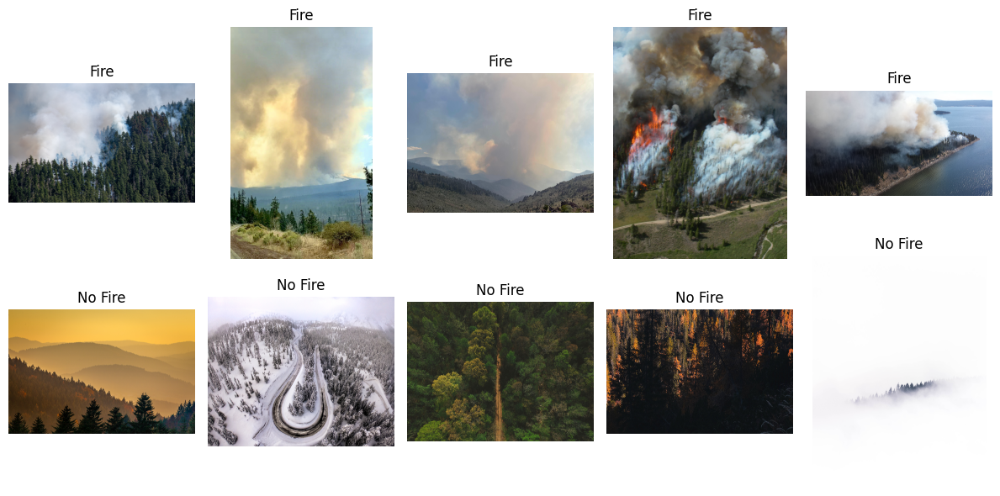

İşlem tamamlandı


In [6]:
# Görselleştirme için bir fonksiyon yazalım
def visualize_samples(fire_dir, nofire_dir):
    # Yangın olan görsellerden birkaçını alalım
    fire_images = [os.path.join(fire_dir, fname) for fname in os.listdir(fire_dir)[:5]]
    # Yangın olmayan görsellerden birkaçını alalım
    nofire_images = [os.path.join(nofire_dir, fname) for fname in os.listdir(nofire_dir)[:5]]

    plt.figure(figsize=(12, 6))

    # Yangın olan görselleri çizdirelim
    for i, img_path in enumerate(fire_images):
        plt.subplot(2, 5, i + 1)
        img = plt.imread(img_path)
        plt.imshow(img)
        plt.title('Fire')
        plt.axis('off')

    # Yangın olmayan görselleri çizdirelim
    for i, img_path in enumerate(nofire_images):
        plt.subplot(2, 5, i + 6)
        img = plt.imread(img_path)
        plt.imshow(img)
        plt.title('No Fire')
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

# Eğitim setinden örnekleri görselleştirelim
print("Eğitim Setinden Örnek Görüntüler:")
visualize_samples(train_fire_dir, train_nofire_dir)
print("İşlem tamamlandı")

# Görüntü Ön İşleme: Yeniden Boyutlandırma ve Normalleştirme
---

Derin öğrenme modelleri, özellikle Evrişimli Sinir Ağları (CNN), işleyecekleri tüm görüntülerin aynı boyutta ve standart bir değer aralığında olmasını bekler. Veri setimizdeki görüntüler farklı boyutlarda ve 0-255 arasında değişen piksel değerlerine sahip olabileceğinden, bunları modelin işleyebileceği tutarlı bir formata getirmek zorunludur. Bu adımda, Keras'ın **ImageDataGenerator** sınıfı kullanılarak bu ön işleme adımları verimli bir şekilde gerçekleştirilmiştir.

Bu süreç iki temel adımdan oluşur:

**Yeniden Boyutlandırma (target_size):** Tüm görüntüler, modelin giriş katmanı için belirlenen 224x224 piksel gibi standart bir boyuta getirilir. Bu, tüm verilerin tek bir sabit boyutta olmasını sağlar.

**Normalleştirme (rescale):** Görüntülerin piksel değerleri (0-255 aralığındaki tam sayılar), 1./255 ile çarpılarak 0 ile 1 arasında değişen ondalıklı sayılara dönüştürülür. Bu işlem, modelin eğitim sürecini önemli ölçüde hızlandırır ve daha kararlı hale getirir.

Ayrıca, **batch_size** parametresi ile modelin eğitim sırasında verileri küçük gruplar (toplu işler) halinde alması sağlanır. Bu, tüm veri setini tek seferde belleğe yüklemek yerine, 32'lik gruplar halinde işleyerek bellek kullanımını optimize eder ve daha verimli bir eğitim süreci sağlar.

In [7]:
# Görüntü boyutları ve batch boyutu için değişkenler tanımlayalım
IMG_HEIGHT = 224
IMG_WIDTH = 224
BATCH_SIZE = 32

# Eğitim verileri için bir veri üreteci (generator) oluşturalım
# Normalleştirme işlemi burada yapılır. Veri çoğaltmayı (augmentation) bir sonraki adımda ekleyeceğiz.
train_image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

# Doğrulama ve test verileri için bir veri üreteci oluşturalım
# Bu setlere augmentation uygulanmaz, sadece normalleştirme yapılır.
validation_image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
test_image_generator = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)


# 'flow_from_directory' metodu ile verileri dizinlerden okuyup hazırlayalım
train_data_gen = train_image_generator.flow_from_directory(
    directory=train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary' # İki sınıf olduğu için 'binary' kullanıyoruz
)

val_data_gen = validation_image_generator.flow_from_directory(
    directory=val_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary'
)

test_data_gen = test_image_generator.flow_from_directory(
    directory=test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False # Test verisini karıştırmıyoruz
)

# Sınıf indekslerini kontrol edelim
print("\nSınıflara atanan indeksler:", train_data_gen.class_indices)
print("İşlem tamamlandı.")

Found 1887 images belonging to 2 classes.
Found 402 images belonging to 2 classes.
Found 410 images belonging to 2 classes.

Sınıflara atanan indeksler: {'fire': 0, 'nofire': 1}
İşlem tamamlandı.


# Veri Çoğaltma (Data Augmentation) ile Modelin Genelleme Yeteneğinin Artırılması
---

Derin öğrenme modelleri, yüksek performans gösterebilmek için genellikle çok büyük ve çeşitli veri setlerine ihtiyaç duyarlar. Sınırlı sayıda veriyle eğitildiklerinde, modelin eğitim setindeki örnekleri ezberlemesi ve daha önce görmediği yeni veriler üzerinde düşük performans göstermesi riski ortaya çıkar. Bu duruma **aşırı öğrenme (overfitting)** denir.

Bu sorunu çözmek ve modelin genelleme yeteneğini artırmak için, projede veri çoğaltma tekniği kullanılmıştır. Bu teknik, mevcut eğitim görüntülerine anlık olarak (on-the-fly) küçük ve rastgele geometrik veya renk dönüşümleri uygulayarak yapay olarak yeni ve benzersiz veri örnekleri oluşturur. Bu sayede, model aynı nesneyi farklı açılardan, aydınlatma koşullarından ve pozisyonlardan görerek, nesnenin temel özelliklerini daha sağlam bir şekilde öğrenir.

**Albumentations ile Veri Çoğaltma Pipeline**'ının Oluşturulması Bu projede, veri çoğaltma işlemleri için yüksek performanslı ve esnek bir kütüphane olan **Albumentations** tercih edilmiştir. Uygulanacak tüm dönüşümler, bir "pipeline" (boru hattı) içinde A.Compose ile birleştirilir. Bir görüntü bu pipeline'a girdiğinde, tanımlanan tüm dönüşümler sırayla veya belirtilen olasılığa (p parametresi) bağlı olarak uygulanır.

**Önemli Not:** Veri çoğaltma işlemleri, modelin öğrenme kapasitesini artırmak amacıyla sadece eğitim setine (train_transforms) uygulanır. Modelin gerçek dünya performansını ölçen doğrulama ve test setleri (val_test_transforms), rastgele dönüşümlere uğratılmaz; onlara sadece standart yeniden boyutlandırma ve normalleştirme işlemleri uygulanır.

In [8]:
# Eğitim verileri için güçlü ve çeşitli bir veri çoğaltma pipeline'ı oluşturalım.
# Bu pipeline, modelin farklı senaryoları öğrenmesini sağlar.
train_transforms = A.Compose([
    # Her zaman önce görüntüyü hedef boyuta getiriyoruz.
    A.Resize(height=IMG_HEIGHT, width=IMG_WIDTH),
    
    # Görüntüyü %50 ihtimalle yatay olarak çevir.
    A.HorizontalFlip(p=0.5),
    
    # Görüntüyü -30 ile +30 derece arasında rastgele döndür.
    A.Rotate(limit=30, p=0.8),
    
    # Görüntünün parlaklığını ve kontrastını rastgele ayarla.
    A.RandomBrightnessContrast(p=0.6),
    
    # Aşağıdaki efektlerden SADECE BİRİNİ rastgele uygula (görüntü kalitesini bozma simülasyonu).
    A.OneOf([
        A.Blur(blur_limit=3, p=0.5), # Görüntüyü hafifçe bulanıklaştır.
        A.GaussNoise(p=0.5), # Görüntüye gürültü ekle.
    ], p=0.5),
    
    # CoarseDropout (Cutout): Görüntüden rastgele kareler siler.
    # Bu, modelin nesnenin tamamını görmeden de tanımayı öğrenmesini sağlar.
    A.CoarseDropout(max_holes=8, max_height=16, max_width=16, p=0.7),
    
    # Piksel değerlerini [0, 255] aralığından [0, 1] aralığına normalize et.
    # Bu adım her zaman en sonda olmalıdır.
    A.Normalize(mean=(0.0, 0.0, 0.0), std=(1.0, 1.0, 1.0), max_pixel_value=255.0)
])

# Doğrulama ve Test verileri için SADECE yeniden boyutlandırma ve normalleştirme yapılır.
val_test_transforms = A.Compose([
    A.Resize(height=IMG_HEIGHT, width=IMG_WIDTH),
    A.Normalize(mean=(0.0, 0.0, 0.0), std=(1.0, 1.0, 1.0), max_pixel_value=255.0)
])

print("✅ Albumentations pipeline'ları başarıyla oluşturuldu.")

✅ Albumentations pipeline'ları başarıyla oluşturuldu.


# Özel Veri Üreteci (Custom Data Generator) Oluşturulması
---

**Albumentations** kütüphanesi, standart Keras veri yükleyicilerinden (ImageDataGenerator) farklı olarak doğrudan dosya yolları üzerinde değil, hafızadaki NumPy dizileri (array'ler) üzerinde çalışır. Bu esneklik ve hız avantajını Keras modelimizle uyumlu hale getirmek için, Keras'ın **keras.utils.Sequence** sınıfından miras alan özel bir veri üreteci (**WildfireDataGenerator**) oluşturulmuştur.

Bu yaklaşım, bize aşağıdaki avantajları sağlar:

**Tam Kontrol:** Verilerin diskten nasıl okunacağı, nasıl işleneceği ve modele nasıl besleneceği üzerinde tam kontrol sahibi oluruz.

**Verimlilik:** Sequence sınıfı, Keras'ın çoklu işlem (multiprocessing) yetenekleriyle uyumlu çalışarak veri yükleme sürecini hızlandırır ve eğitim sırasında GPU'nun boş kalmasını engeller.

**Anlık (On-the-fly) İşleme:** Veri çoğaltma işlemleri, her bir veri grubu (batch) istendiğinde anlık olarak uygulanır. Bu, diskte fazladan yer kaplamadan neredeyse sonsuz sayıda veri varyasyonu üretmemizi sağlar.

---

Aşağıdaki WildfireDataGenerator sınıfı, bu görevi yerine getirmek için tasarlanmıştır.

Bu kod bloğu sonucunda, **train_generator**, val_generator ve test_generator adında, Keras'ın **model.fit()** ve **model.evaluate()** fonksiyonlarıyla doğrudan uyumlu çalışan üç adet veri üreteci nesnesi oluşturulmuştur. **shuffle=True** parametresi, eğitim sırasında modelin her epoch'ta verileri farklı bir sırada görerek daha iyi genelleme yapmasını sağlarken, **shuffle=False** parametresi doğrulama ve test setlerinde tutarlı bir değerlendirme yapılabilmesi için verilerin sırasını sabit tutar.

In [9]:
# Bu sınıf, verileri diskten okur, albumentations ile çoğaltır ve modele besler.

class WildfireDataGenerator(Sequence):
    
    def __init__(self, directory, batch_size=32, augmentor=None, shuffle=True, **kwargs):
        super().__init__(**kwargs) 
        self.image_paths = []
        self.labels = []
        self.batch_size = batch_size
        self.augmentor = augmentor
        self.shuffle = shuffle
        
        class_names = sorted(os.listdir(directory))
        self.class_indices = {name: i for i, name in enumerate(class_names)}
        
        print(f"\nVeri setindeki görüntüler doğrulanıyor: {directory}")
        for class_name in class_names:
            class_path = os.path.join(directory, class_name)
            class_label = self.class_indices[class_name]
            for fname in os.listdir(class_path):
                fpath = os.path.join(class_path, fname)
                
                # Görüntüyü doğrudan okumaya çalış.
                img = cv2.imread(fpath)
                
                # Eğer 'img' boş değilse (yani okuma başarılıysa), listeye ekle.
                if img is not None:
                    self.image_paths.append(fpath)
                    self.labels.append(class_label)
                else:
                    # Eğer okuma başarısızsa, bir uyarı yazdır ve bu dosyayı atla.
                    print(f" >> UYARI: Bozuk veya geçersiz dosya atlandı: {fpath}")

        print(f" >> Doğrulama tamamlandı. {len(self.image_paths)} adet geçerli görüntü bulundu.")
        
        self.indexes = np.arange(len(self.image_paths))
        if self.shuffle:
            self.on_epoch_end()


    def __len__(self):
        return int(np.floor(len(self.image_paths) / self.batch_size))

    def __getitem__(self, index):
        batch_indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        batch_paths = [self.image_paths[k] for k in batch_indexes]
        batch_labels = [self.labels[k] for k in batch_indexes]
        X, y = self.__data_generation(batch_paths, batch_labels)
        return X, y

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __data_generation(self, batch_paths, batch_labels):
        X = np.empty((self.batch_size, IMG_HEIGHT, IMG_WIDTH, 3), dtype=np.float32)
        y = np.empty((self.batch_size), dtype=int)
        
        for i, path in enumerate(batch_paths):
            image = cv2.imread(path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            
            if self.augmentor:
                augmented = self.augmentor(image=image)
                image = augmented['image']
            
            X[i,] = image
            y[i] = batch_labels[i]
            
        return X, np.array(y)

# Üreteçleri oluşturalım 
train_generator = WildfireDataGenerator(train_dir, batch_size=BATCH_SIZE, augmentor=train_transforms, shuffle=True)
val_generator = WildfireDataGenerator(val_dir, batch_size=BATCH_SIZE, augmentor=val_test_transforms, shuffle=False)
test_generator = WildfireDataGenerator(test_dir, batch_size=BATCH_SIZE, augmentor=val_test_transforms, shuffle=False)

print("\n✅ Veri üreteçleri, sağlamlaştırılmış sınıf kullanılarak başarıyla yeniden oluşturuldu.")
print("Sınıf İndeksleri:", train_generator.class_indices)


Veri setindeki görüntüler doğrulanıyor: /kaggle/input/the-wildfire-dataset/the_wildfire_dataset_2n_version/train


libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50
[ WARN:0@124.266] global grfmt_png.cpp:695 read_chunk chunk data is too large
Invalid SOS parameters for sequential JPEG
[ WARN:0@369.680] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile
Invalid SOS parameters for sequential JPEG


 >> Doğrulama tamamlandı. 1887 adet geçerli görüntü bulundu.

Veri setindeki görüntüler doğrulanıyor: /kaggle/input/the-wildfire-dataset/the_wildfire_dataset_2n_version/val
 >> UYARI: Bozuk veya geçersiz dosya atlandı: /kaggle/input/the-wildfire-dataset/the_wildfire_dataset_2n_version/val/fire/desktop.ini
 >> Doğrulama tamamlandı. 402 adet geçerli görüntü bulundu.

Veri setindeki görüntüler doğrulanıyor: /kaggle/input/the-wildfire-dataset/the_wildfire_dataset_2n_version/test


[ WARN:0@586.531] global grfmt_png.cpp:695 read_chunk chunk data is too large


 >> Doğrulama tamamlandı. 410 adet geçerli görüntü bulundu.

✅ Veri üreteçleri, sağlamlaştırılmış sınıf kullanılarak başarıyla yeniden oluşturuldu.
Sınıf İndeksleri: {'fire': 0, 'nofire': 1}


# Veri Üretim Sürecinin Doğrulanması ve Analizi
---

Bu bölümde, projenin veri işleme altyapısının iki kritik yönü ele alınmıştır: Birincisi, oluşturulan **veri çoğaltma (augmentation) pipeline**'ının doğru çalıştığının görsel olarak teyit edilmesi; ikincisi ise veri setinin sayısal özelliklerinin ve eğitim sürecindeki veri akışının özetlenmesidir.

---

**1. Çoğaltılmış Görüntülerin Görsel Olarak Doğrulanması**

Albumentations ve özel WildfireDataGenerator sınıfı ile kurulan veri işleme pipeline'ının beklendiği gibi çalışıp çalışmadığını kontrol etmek amacıyla, **visualize_augmented_samples** adında bir fonksiyon oluşturulmuştur. Bu fonksiyonun temel görevleri şunlardır:
Belirtilen bir veri üretecinden (generator) ve sınıftan (class_name) yeterli sayıda örnek bulana kadar veri gruplarını (batch) çeker.
Bulunan örnekler arasından rastgele olarak istenen sayıda (num_samples) görüntü seçer.
Bu seçilen görüntüleri, [0, 1] aralığındaki normalize edilmiş formattan tekrar [0, 255] aralığındaki standart resim formatına dönüştürür.
Son olarak, bu işlenmiş görüntüleri etiketleriyle birlikte ekrana çizdirir.
Bu fonksiyon, train_generator kullanılarak hem 'fire' hem de 'nofire' sınıfları için çağrılmıştır. Bu işlem, veri çoğaltma pipeline'ının anlık olarak uyguladığı döndürme, parlaklık değiştirme ve **CoarseDropout** gibi efektleri somut olarak görmemizi sağlar. Kodu her çalıştırdığımızda farklı görsellerin üretilmesi, veri çoğaltma sürecinin dinamik ve başarılı bir şekilde çalıştığını doğrular.

---

**2. Veri Seti ve Üretim Sürecinin Sayısal Özeti**

Görsel doğrulamaya ek olarak, veri setinin genel yapısını ve modelin eğitim sırasında ne kadar veriyle karşılaşacağını anlamak için sayısal bir özet oluşturulmuştur. Bu özet, aşağıdaki bilgileri içerir:

**Orijinal Görüntü Sayıları:** train, val ve test setlerinde bulunan toplam doğrulanmış (bozuk olmayan) görüntü sayıları.

**Veri Çoğaltma Mantığı:** Veri çoğaltma işleminin diske yeni resimler kaydetmediği, bunun yerine görüntülerin her bir eğitim adımı için hafızada (RAM) anlık olarak oluşturulduğu vurgulanmıştır. Bu, disk alanından tasarruf ederken neredeyse sonsuz veri çeşitliliği sağlar.

**Eğitim Döngüsü (Epoch) Başına Veri Akışı:** Modelin bir epoch boyunca toplam kaç adım (batch) atacağı ve her adımda kaç adet (BATCH_SIZE) benzersiz şekilde çoğaltılmış görüntü göreceği hesaplanmıştır. Bu, modelin bir eğitim döngüsünde toplam kaç adet işlenmiş görüntü ile eğitileceğini net bir şekilde ortaya koyar.

Bu iki aşamalı doğrulama ve analiz süreci, projenin ilerleyen adımlarında kullanılacak olan veri işleme altyapısının hem doğru çalıştığından hem de verimli olduğundan emin olunmasını sağlamıştır.


 Aranıyor: 'fire' sınıfından 5 adet rastgele örnek...
 gösteriliyor: 'fire' sınıfından çoğaltılmış 5 örnek.


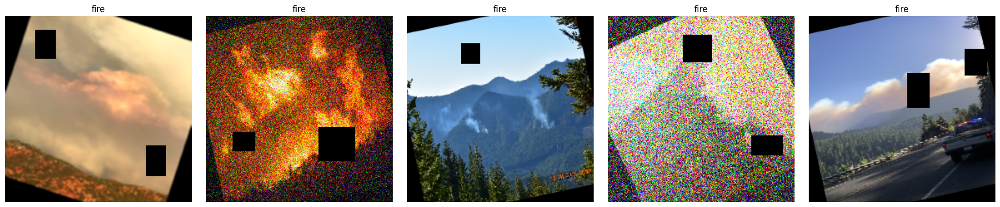


 Aranıyor: 'nofire' sınıfından 5 adet rastgele örnek...
 gösteriliyor: 'nofire' sınıfından çoğaltılmış 5 örnek.


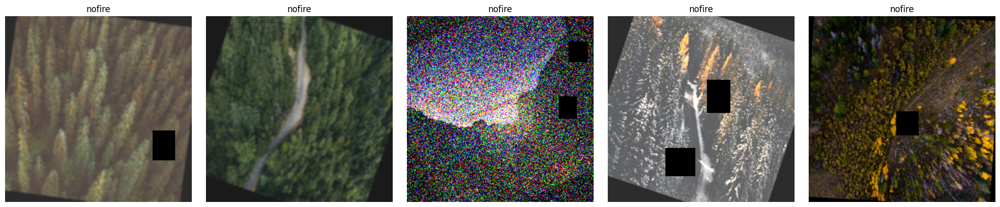


Veri setindeki görüntüler doğrulanıyor: /kaggle/input/the-wildfire-dataset/the_wildfire_dataset_2n_version/train


libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50
[ WARN:0@774.242] global grfmt_png.cpp:695 read_chunk chunk data is too large
Invalid SOS parameters for sequential JPEG
[ WARN:0@994.572] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile
Invalid SOS parameters for sequential JPEG


 >> Doğrulama tamamlandı. 1887 adet geçerli görüntü bulundu.

Veri setindeki görüntüler doğrulanıyor: /kaggle/input/the-wildfire-dataset/the_wildfire_dataset_2n_version/val
 >> UYARI: Bozuk veya geçersiz dosya atlandı: /kaggle/input/the-wildfire-dataset/the_wildfire_dataset_2n_version/val/fire/desktop.ini
 >> Doğrulama tamamlandı. 402 adet geçerli görüntü bulundu.

Veri setindeki görüntüler doğrulanıyor: /kaggle/input/the-wildfire-dataset/the_wildfire_dataset_2n_version/test


[ WARN:0@1184.815] global grfmt_png.cpp:695 read_chunk chunk data is too large


 >> Doğrulama tamamlandı. 410 adet geçerli görüntü bulundu.
✅ Veri üreteçleri başarıyla oluşturuldu.
Sınıf İndeksleri: {'fire': 0, 'nofire': 1}
--------------------------------------------------

--- Veri Seti ve Üretim Özeti ---

Orijinal Eğitim Görüntüsü Sayısı: 1887
Orijinal Doğrulama Görüntüsü Sayısı: 402
Orijinal Test Görüntüsü Sayısı: 410
--------------------------------------------------
Veri Çoğaltma (Augmentation) Bilgisi:
 >> Bu işlem, diske yeni resimler KAYDETMEZ.
 >> Görüntüler, model eğitilirken HER BATCH için HAFIZADA anlık olarak oluşturulur.

Model, her bir eğitim döngüsü (epoch) boyunca:
 >> Toplam 58 adım (batch) atacaktır.
 >> Her adımda 32 adet benzersiz şekilde çoğaltılmış görüntü görecektir.
 >> Sonuç olarak, bir epoch'ta toplam 1856 adet ÇOĞALTILMIŞ GÖRÜNTÜ ile eğitilecektir.
--------------------------------------------------


In [10]:
# Belirli Bir Sınıftan Rastgele Örnekleri Bulup Gösteren Fonksiyon 

def visualize_augmented_samples(generator, class_name, num_samples=5):
    """
    Verilen generator içinden, belirtilen sınıfa ait rastgele sayıda örneği bulur ve görselleştirir.
    """
    print(f"\n Aranıyor: '{class_name}' sınıfından {num_samples} adet rastgele örnek...")
    
    collected_images = []
    class_label_index = generator.class_indices[class_name]
    
    # Yeterli sayıda örnek bulana kadar generator'dan veri çek
    gen_iterator = iter(generator)
    while len(collected_images) < num_samples:
        try:
            images, labels = next(gen_iterator)
            for img, lbl in zip(images, labels):
                if lbl == class_label_index:
                    collected_images.append(img)
        except StopIteration:
            print("Generator'daki tüm veriler tarandı.")
            break

    if not collected_images:
        print(f"'{class_name}' sınıfına ait hiç görüntü bulunamadı.")
        return
        
    # Bulunanlar arasından rastgele seçim yap (eğer gerekenden fazla bulunduysa)
    selected_images = random.sample(collected_images, min(num_samples, len(collected_images)))
    
    # Görselleştirme
    num_to_show = len(selected_images)
    fig, axes = plt.subplots(1, num_to_show, figsize=(num_to_show * 4, 4))
    if num_to_show == 1: axes = [axes] # Tek resim durumu için
    
    print(f" gösteriliyor: '{class_name}' sınıfından çoğaltılmış {num_to_show} örnek.")
    for img, ax in zip(selected_images, axes):
        # Normalizasyonu geri al ve çizdir
        img_to_show = (img * 255).astype(np.uint8)
        ax.imshow(img_to_show)
        ax.set_title(class_name)
        ax.axis('off')
    plt.tight_layout()
    plt.show()


# 'fire' sınıfından 5 rastgele örnek göster
visualize_augmented_samples(train_generator, 'fire', num_samples=5)

# 'nofire' sınıfından 5 rastgele örnek göster
visualize_augmented_samples(train_generator, 'nofire', num_samples=5)

train_generator = WildfireDataGenerator(train_dir, batch_size=BATCH_SIZE, augmentor=train_transforms, shuffle=True)
val_generator = WildfireDataGenerator(val_dir, batch_size=BATCH_SIZE, augmentor=val_test_transforms, shuffle=False)
test_generator = WildfireDataGenerator(test_dir, batch_size=BATCH_SIZE, augmentor=val_test_transforms, shuffle=False)

print("✅ Veri üreteçleri başarıyla oluşturuldu.")
print("Sınıf İndeksleri:", train_generator.class_indices)
print("-" * 50) 




# 1. Orijinal veri setlerindeki resim sayılarını alalım.
#    train_generator.n veya len(train_generator.labels) bu sayıyı verir.
num_original_train_images = len(train_generator.image_paths)
num_original_val_images = len(val_generator.image_paths)
num_original_test_images = len(test_generator.image_paths)

# 2. Bir epoch boyunca modelin göreceği çoğaltılmış görüntü sayısını hesaplayalım.
#    Bu sayı, orijinal eğitim görüntüsü sayısına çok yakın olacaktır.
#    (Eğer toplam resim sayısı batch_size'a tam bölünmüyorsa, arta kalanlar bir sonraki epoch'a kalır.)
images_seen_per_epoch = len(train_generator) * BATCH_SIZE

print("\n--- Veri Seti ve Üretim Özeti ---\n")

print(f"Orijinal Eğitim Görüntüsü Sayısı: {num_original_train_images}")
print(f"Orijinal Doğrulama Görüntüsü Sayısı: {num_original_val_images}")
print(f"Orijinal Test Görüntüsü Sayısı: {num_original_test_images}")
print("-" * 50)

print("Veri Çoğaltma (Augmentation) Bilgisi:")
print(" >> Bu işlem, diske yeni resimler KAYDETMEZ.")
print(" >> Görüntüler, model eğitilirken HER BATCH için HAFIZADA anlık olarak oluşturulur.\n")

print(f"Model, her bir eğitim döngüsü (epoch) boyunca:")
print(f" >> Toplam {len(train_generator)} adım (batch) atacaktır.")
print(f" >> Her adımda {BATCH_SIZE} adet benzersiz şekilde çoğaltılmış görüntü görecektir.")
print(f" >> Sonuç olarak, bir epoch'ta toplam {images_seen_per_epoch} adet ÇOĞALTILMIŞ GÖRÜNTÜ ile eğitilecektir.")

print("-" * 50)

# CNN Model Mimarisi: Katman Katman Özellik Çıkarımı
---

Projenin temelini oluşturan orman yangını tespiti görevi için, **Keras'ın Sequential API**'si kullanılarak modern ve güçlü bir Evrişimli Sinir Ağı (CNN) modeli inşa edilmiştir. Sequential API, katmanların birbiri ardına doğrusal bir şekilde eklendiği, anlaşılır ve yaygın bir model oluşturma yöntemidir.

Modelin mimarisi, iki ana bölümden oluşacak şekilde tasarlanmıştır:

**Özellik Çıkarım Bölümü (Convolutional Base):** Bu bölüm, ardışık evrişim bloklarından oluşur. Görevi, bir görüntüdeki düşük seviyeli özelliklerden (kenarlar, renkler) başlayarak, daha karmaşık ve hiyerarşik özelliklere (dokular, şekiller, desenler) doğru öğrenim yapmaktır.

**Sınıflandırma Bölümü (Classifier Head):** Bu bölüm, özellik çıkarım bölümünden gelen zengin özellik haritalarını alır, bunları tek boyutlu bir vektöre dönüştürür ve nihai olarak görüntünün "fire" mı yoksa "nofire" mı olduğuna dair bir olasılık skoru üretir.

---

**Modelin Katman Detayları**

**keras.Input:** Modelin giriş katmanıdır ve 224x224 piksel boyutunda, 3 renk kanalına (RGB) sahip görüntüleri kabul edeceğini belirtir.

--> **Evrişim Blokları (Conv2D, BatchNormalization, Activation, MaxPooling2D):** Model, dört adet evrişim bloğundan oluşur. Her blokta:

--> **Conv2D:** Görüntü üzerinde 3x3 boyutundaki filtreleri gezdirerek görsel özellikleri (desenleri) tespit eder. Model derinleştikçe (32 -> 64 -> 128 filtre) daha karmaşık ve soyut özellikler öğrenir.

--> **BatchNormalization:** Eğitim sürecini stabilize eder ve hızlandırır.

--> **Activation('relu'):** Modele karmaşık ilişkileri öğrenme yeteneği kazandırır.

--> **MaxPooling2D:** Özellik haritalarının boyutunu küçülterek en önemli bilgileri özetler ve hesaplama verimliliğini artırır.

**Sınıflandırma Katmanları:**

--> **Flatten:** Özellik çıkarım bölümünden gelen iki boyutlu özellik haritalarını, sınıflandırma bölümünün işleyebileceği tek boyutlu bir vektöre dönüştürür.

--> **Dense(512):** Bu tam bağlantılı katman, düzleştirilmiş özellik vektörünü alarak sınıflar arasındaki karmaşık ilişkileri öğrenir.

--> **Dropout(0.5):** Aşırı öğrenmeyi (overfitting) önlemek için eğitim sırasında nöronların %50'sini rastgele devre dışı bırakır.

--> **Dense(1, activation="sigmoid"):** Modelin son katmanıdır. Tek bir nörondan oluşur ve sigmoid fonksiyonu sayesinde çıktıyı 0 ile 1 arasında bir olasılık değerine dönüştürür. Bu değer, görüntünün "fire" sınıfına ait olma olasılığını temsil eder.

In [11]:
import tensorflow as tf
from tensorflow import keras 
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
model = Sequential([
    keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3)),

    # İlk blok
    layers.Conv2D(32, (3, 3), padding="same"),
    layers.BatchNormalization(),
    layers.Activation("relu"),
    layers.MaxPooling2D(pool_size=(2, 2)),

    # İkinci blok
    layers.Conv2D(64, (3, 3), padding="same"),
    layers.BatchNormalization(),
    layers.Activation("relu"),
    layers.MaxPooling2D(pool_size=(2, 2)),

    # Üçüncü blok
    layers.Conv2D(128, (3, 3), padding="same"),
    layers.BatchNormalization(),
    layers.Activation("relu"),
    layers.MaxPooling2D(pool_size=(2, 2)),
    
     # dördüncü blok
    layers.Conv2D(128, (3, 3), padding="same"),
    layers.BatchNormalization(),
    layers.Activation("relu"),
    layers.MaxPooling2D(pool_size=(2, 2)),

    # Flatten + Dense
    layers.Flatten(),
    layers.Dense(512),
    layers.BatchNormalization(),
    layers.Activation("relu"),
    layers.Dropout(0.5),

    # Çıkış katmanı
    layers.Dense(1, activation="sigmoid")
])

print("✅ BatchNormalization ile CNN modeli oluşturuldu.")

I0000 00:00:1758682390.306772      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


✅ BatchNormalization ile CNN modeli oluşturuldu.


# Modelin Eğitilmiş Ağırlıklarının Kaydedilmesi
---

Modelin eğitimi, saatler sürebilen, hesaplama açısından yoğun bir süreçtir. Eğitim tamamlandıktan sonra, modelin öğrendiği tüm bilgiler (ağırlıklar ve sapmalar) sadece geçici bellekte (RAM) bulunur. Eğer program sonlanırsa veya çalışma ortamı (örneğin Kaggle/Colab) kapanırsa, tüm bu değerli ilerleme kaybolur. Bu kaybı önlemek ve modeli daha sonra tekrar kullanabilmek için, eğitilmiş ağırlıkların kalıcı bir dosyaya kaydedilmesi kritik bir adımdır.

Bu işlem, Keras'ın **model.save_weights()** fonksiyonu kullanılarak gerçekleştirilmiştir. Bu fonksiyon, modelin mimarisini (katman yapısını) değil, sadece eğitim sırasında öğrendiği sayısal parametreleri (ağırlıkları) alır ve belirtilen dosyaya kaydeder. Dosya formatı olarak, büyük veri setlerini verimli bir şekilde depolamak için kullanılan standart bir format olan HDF5 (.h5 veya .weights.h5 uzantısı) tercih edilmiştir.

In [12]:
print("Eğitilmiş modelin SADECE AĞIRLIKLARI 'wildfire_model_weights.weights.h5' dosyasına kaydediliyor...")
model.save_weights('wildfire_model_weights.weights.h5')
print("✅ Ağırlıklar başarıyla kaydedildi.")

Eğitilmiş modelin SADECE AĞIRLIKLARI 'wildfire_model_weights.weights.h5' dosyasına kaydediliyor...
✅ Ağırlıklar başarıyla kaydedildi.


# Model Mimarisi Özeti
---

Modelin yapısını, katmanların sırasını, her katmanın çıktı boyutunu ve öğrenilecek parametre sayısını doğrulamak için **model.summary()** fonksiyonu kullanılır. Bu özet, modelin beklenen şekilde oluşturulduğunu teyit etmenin ve karmaşıklığı hakkında hızlı bir fikir edinmenin en etkili yoludur.

In [13]:
# Modelin mimarisini ve parametre sayısını özet olarak yazdırır.
model.summary()

# ----------------------------------------------------
# model.summary() Çıktısını Anlamak:
#
# - Layer (type): Katmanın türünü ve adını gösterir.
# - Output Shape: Her katmandan sonra verinin boyutu nasıl değişiyor.
# - Param #: Katmandaki öğrenilecek parametre sayısı.
# - Total params: Modelin toplam parametre sayısı.
# - Trainable params: Eğitim sırasında güncellenecek parametreler.

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    12,845,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴─────────────

 Total params: 13,090,369 (49.94 MB)

 Trainable params: 13,088,641 (49.93 MB)

 Non-trainable params: 1,728 (6.75 KB)

# Modelin Derlenmesi: Öğrenme Stratejisinin Belirlenmesi
---

Modelin mimarisi oluşturulduktan sonra, eğitim sürecine başlamadan önce **compile()** metodu ile yapılandırılması gerekir. Bu adım, aslında modele nasıl öğreneceğini söyleyen bir "öğrenme planı" oluşturmak anlamına gelir. Bu plan, üç temel bileşenden oluşur:

**Eniyileştirici (Optimizer):** Modelin tahminlerindeki hatayı (kaybı) en aza indirmek için kendi iç ağırlıklarını nasıl güncelleyeceğini belirleyen algoritmadır.

**Kayıp Fonksiyonu (Loss Function):** Modelin tahminlerinin, gerçek etiketlerden ne kadar "uzak" veya "yanlış" olduğunu sayısal olarak ölçen bir fonksyondur. Model, bu fonksiyonun ürettiği değeri minimize etmeye çalışır.

**Metrikler (Metrics):** Eğitim ve değerlendirme sırasında modelin performansını insan tarafından anlaşılabilir bir şekilde izlemek için kullanılan ölçütlerdir.

---

--> **Eniyileştirici - adam:** "Adam" (Adaptive Moment Estimation), modern derin öğrenme uygulamalarında en yaygın olarak kullanılan eniyileştiricilerden biridir. Öğrenme oranını (learning rate) eğitim sırasında her bir ağırlık için dinamik olarak uyarlayabilme yeteneği sayesinde, hem hızlı yakınsama sağlar hem de birçok farklı problem türünde kararlı ve etkili sonuçlar verir. Bu nedenle, bu proje için güçlü bir başlangıç noktası olarak tercih edilmiştir.

--> **Kayıp Fonksiyonu - binary_crossentropy:** Bu problem, iki sınıflı (yangın var / yangın yok) bir sınıflandırma problemi olduğu için "ikili çapraz entropi" kayıp fonksiyonu seçilmiştir. Bu fonksiyon, modelin sigmoid aktivasyonu ile ürettiği olasılık çıktısı (0 ile 1 arasında bir değer) ile gerçek etiket (0 veya 1) arasındaki tutarsızlığı ölçmek için matematiksel olarak en uygun yöntemdir.

--> **Metrik - accuracy:** "Doğruluk", en sezgisel performans metriğidir ve modelin yaptığı toplam tahminlerin yüzde kaçının doğru olduğunu gösterir. Eğitim sürecinin her bir adımında (epoch) bu metriğin takip edilmesi, modelin öğrenme sürecinin ne kadar iyi ilerlediği hakkında net bir fikir verir.

In [14]:
# Modeli derleme
model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

print("✅ Model başarıyla derlendi.")
print("   - Eniyileştirici: Adam")
print("   - Kayıp Fonksiyonu: Binary Crossentropy")
print("   - İzleme Metriği: Accuracy")

✅ Model başarıyla derlendi.
   - Eniyileştirici: Adam
   - Kayıp Fonksiyonu: Binary Crossentropy
   - İzleme Metriği: Accuracy


# Modelin Eğitilmesi
---

Modelin mimarisi oluşturulup, öğrenme stratejisi derlendikten sonra, **model.fit()** fonksiyonu kullanılarak eğitim süreci başlatılmıştır. Bu aşama, modelin train_generator'dan gelen veri gruplarını (batch) kullanarak, fire ve nofire sınıflarını ayırt etmeyi sağlayan içsel desenleri ve özellikleri öğrenmeye başladığı yerdir.
Eğitim süreci, veri seti üzerinden belirli sayıda tekrardan (**epoch**) oluşur. Her bir epoch, modelin tüm eğitim veri setini bir kez görmesi ve ağırlıklarını güncellemesi anlamına gelir.

---

**model.fit() Fonksiyonunun Temel Parametreleri**

**train_generator:** Modelin öğrenmesi için veri sağlayan, daha önce oluşturduğumuz özel veri üretecidir. Bu üreteç, her adımda anlık olarak (on-the-fly) veri çoğaltma (augmentation) uygulayarak modele sürekli yeni ve çeşitli görüntüler sunar.

**epochs=EPOCHS:** Modelin tüm eğitim veri seti üzerinden toplam kaç kez geçeceğini belirtir. Yeterli sayıda epoch, modelin verideki desenleri tam olarak öğrenmesini sağlarken, çok fazla epoch aşırı öğrenmeye (overfitting) yol açabilir. Projede bu değer 25 olarak belirlenmiştir.

**validation_data=val_generator:** Bu, eğitimin en kritik bileşenlerinden biridir. Her epoch tamamlandıktan sonra, modelin o ana kadar öğrendikleriyle daha önce hiç görmediği doğrulama (validation) veri seti üzerindeki performansı test edilir. Bu sayede modelin sadece eğitim verilerini ezberleyip ezberlemediği, yani genelleme yapıp yapamadığı kontrol edilir.

**steps_per_epoch ve validation_steps:** Veri üreteci (generator) kullanıldığında, Keras'a bir epoch'un kaç veri grubundan (batch) oluşacağını bildirmek için bu parametreler kullanılır. Değerleri, len(train_generator) ve len(val_generator) olarak ayarlanarak her epoch'ta tüm verilerin kullanılmasını garanti eder.

Eğitim süreci tamamlandığında, **model.fit()** fonksiyonu, her bir epoch'a ait **accuracy**, **loss**, **val_accuracy** ve **val_loss** gibi tüm metrikleri içeren bir **History** nesnesi döndürür. Bu nesne, bir sonraki adımda modelin öğrenme sürecini görselleştirmek ve analiz etmek için kullanılacaktır.

In [15]:
# Eğitim için epoch sayısını belirleyelim.
# Bu değer, denemelerle ayarlanması gereken bir hiperparametredir.
EPOCHS = 10

print("\n🚀 Model eğitimi başlatılıyor...")

# model.fit() fonksiyonu, eğitim sürecindeki tüm metrikleri bir 'History' nesnesinde saklar.
# Bu nesneyi daha sonra grafikleri çizmek için kullanacağız.
history = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    steps_per_epoch=len(train_generator),
    validation_steps=len(val_generator)
)

print("\n🎉 Model eğitimi tamamlandı!")


🚀 Model eğitimi başlatılıyor...
Epoch 1/10


I0000 00:00:1758682422.804324     136 service.cc:148] XLA service 0x7a8bf4002330 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1758682422.805483     136 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1758682423.433393     136 cuda_dnn.cc:529] Loaded cuDNN version 90300


 1/58 ━━━━━━━━━━━━━━━━━━━━ 19:39 21s/step - accuracy: 0.6250 - loss: 0.6006

I0000 00:00:1758682429.097291     136 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


 8/58 ━━━━━━━━━━━━━━━━━━━━ 5:15 6s/step - accuracy: 0.5498 - loss: 0.9776

Invalid SOS parameters for sequential JPEG


15/58 ━━━━━━━━━━━━━━━━━━━━ 4:46 7s/step - accuracy: 0.5681 - loss: 0.9134

[ WARN:5@1405.083] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


23/58 ━━━━━━━━━━━━━━━━━━━━ 3:58 7s/step - accuracy: 0.5842 - loss: 0.8616

[ WARN:5@1461.116] global grfmt_png.cpp:695 read_chunk chunk data is too large


32/58 ━━━━━━━━━━━━━━━━━━━━ 3:00 7s/step - accuracy: 0.5979 - loss: 0.8216

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


45/58 ━━━━━━━━━━━━━━━━━━━━ 1:33 7s/step - accuracy: 0.6111 - loss: 0.7859

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 519s 9s/step - accuracy: 0.6212 - loss: 0.7602 - val_accuracy: 0.5026 - val_loss: 0.7253
Epoch 2/10
20/58 ━━━━━━━━━━━━━━━━━━━━ 4:36 7s/step - accuracy: 0.7264 - loss: 0.5679

[ WARN:8@1960.121] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile
Invalid SOS parameters for sequential JPEG


21/58 ━━━━━━━━━━━━━━━━━━━━ 4:29 7s/step - accuracy: 0.7249 - loss: 0.5702

Invalid SOS parameters for sequential JPEG


23/58 ━━━━━━━━━━━━━━━━━━━━ 4:12 7s/step - accuracy: 0.7219 - loss: 0.5747

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


25/58 ━━━━━━━━━━━━━━━━━━━━ 3:57 7s/step - accuracy: 0.7185 - loss: 0.5798

[ WARN:8@1991.266] global grfmt_png.cpp:695 read_chunk chunk data is too large


58/58 ━━━━━━━━━━━━━━━━━━━━ 510s 9s/step - accuracy: 0.6961 - loss: 0.6141 - val_accuracy: 0.5651 - val_loss: 0.6836
Epoch 3/10
 2/58 ━━━━━━━━━━━━━━━━━━━━ 6:09 7s/step - accuracy: 0.7578 - loss: 0.5103

Invalid SOS parameters for sequential JPEG


 8/58 ━━━━━━━━━━━━━━━━━━━━ 5:37 7s/step - accuracy: 0.7232 - loss: 0.5751

[ WARN:13@2370.175] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


35/58 ━━━━━━━━━━━━━━━━━━━━ 2:34 7s/step - accuracy: 0.6777 - loss: 0.6251

[ WARN:13@2555.108] global grfmt_png.cpp:695 read_chunk chunk data is too large


45/58 ━━━━━━━━━━━━━━━━━━━━ 1:26 7s/step - accuracy: 0.6772 - loss: 0.6212

Invalid SOS parameters for sequential JPEG


49/58 ━━━━━━━━━━━━━━━━━━━━ 59s 7s/step - accuracy: 0.6778 - loss: 0.6190 

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


58/58 ━━━━━━━━━━━━━━━━━━━━ 471s 8s/step - accuracy: 0.6801 - loss: 0.6148 - val_accuracy: 0.7318 - val_loss: 0.5603
Epoch 4/10
 7/58 ━━━━━━━━━━━━━━━━━━━━ 5:51 7s/step - accuracy: 0.6492 - loss: 0.6516

[ WARN:17@2839.109] global grfmt_png.cpp:695 read_chunk chunk data is too large


21/58 ━━━━━━━━━━━━━━━━━━━━ 4:21 7s/step - accuracy: 0.6662 - loss: 0.6195

[ WARN:17@2940.028] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


44/58 ━━━━━━━━━━━━━━━━━━━━ 1:38 7s/step - accuracy: 0.6790 - loss: 0.6104

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


54/58 ━━━━━━━━━━━━━━━━━━━━ 27s 7s/step - accuracy: 0.6815 - loss: 0.6113

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 490s 8s/step - accuracy: 0.6824 - loss: 0.6114 - val_accuracy: 0.6719 - val_loss: 0.5659
Epoch 5/10
 1/58 ━━━━━━━━━━━━━━━━━━━━ 7:19 8s/step - accuracy: 0.7500 - loss: 0.5791

[ WARN:20@3291.207] global grfmt_png.cpp:695 read_chunk chunk data is too large


12/58 ━━━━━━━━━━━━━━━━━━━━ 5:43 7s/step - accuracy: 0.7031 - loss: 0.6114

Invalid SOS parameters for sequential JPEG


40/58 ━━━━━━━━━━━━━━━━━━━━ 2:07 7s/step - accuracy: 0.7140 - loss: 0.5909

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


48/58 ━━━━━━━━━━━━━━━━━━━━ 1:10 7s/step - accuracy: 0.7168 - loss: 0.5866

[ WARN:20@3615.989] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


55/58 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - accuracy: 0.7183 - loss: 0.5837

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 484s 8s/step - accuracy: 0.7187 - loss: 0.5826 - val_accuracy: 0.6406 - val_loss: 0.6576
Epoch 6/10
 1/58 ━━━━━━━━━━━━━━━━━━━━ 8:16 9s/step - accuracy: 0.9062 - loss: 0.3570

[ WARN:24@3772.947] global grfmt_png.cpp:695 read_chunk chunk data is too large


 6/58 ━━━━━━━━━━━━━━━━━━━━ 6:16 7s/step - accuracy: 0.7870 - loss: 0.4839

[ WARN:25@3808.403] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


30/58 ━━━━━━━━━━━━━━━━━━━━ 3:04 7s/step - accuracy: 0.7326 - loss: 0.5309

Invalid SOS parameters for sequential JPEG


31/58 ━━━━━━━━━━━━━━━━━━━━ 2:57 7s/step - accuracy: 0.7318 - loss: 0.5319

Invalid SOS parameters for sequential JPEG


53/58 ━━━━━━━━━━━━━━━━━━━━ 33s 7s/step - accuracy: 0.7281 - loss: 0.5391

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


58/58 ━━━━━━━━━━━━━━━━━━━━ 471s 8s/step - accuracy: 0.7282 - loss: 0.5396 - val_accuracy: 0.7318 - val_loss: 0.5188
Epoch 7/10
24/58 ━━━━━━━━━━━━━━━━━━━━ 3:59 7s/step - accuracy: 0.7593 - loss: 0.5201

[ WARN:29@4403.848] global grfmt_png.cpp:695 read_chunk chunk data is too large


31/58 ━━━━━━━━━━━━━━━━━━━━ 3:13 7s/step - accuracy: 0.7568 - loss: 0.5193

Invalid SOS parameters for sequential JPEG


39/58 ━━━━━━━━━━━━━━━━━━━━ 2:14 7s/step - accuracy: 0.7529 - loss: 0.5214

[ WARN:28@4515.501] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


42/58 ━━━━━━━━━━━━━━━━━━━━ 1:54 7s/step - accuracy: 0.7517 - loss: 0.5219

Invalid SOS parameters for sequential JPEG


46/58 ━━━━━━━━━━━━━━━━━━━━ 1:26 7s/step - accuracy: 0.7505 - loss: 0.5222

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


58/58 ━━━━━━━━━━━━━━━━━━━━ 495s 9s/step - accuracy: 0.7459 - loss: 0.5242 - val_accuracy: 0.7057 - val_loss: 0.5573
Epoch 8/10
 2/58 ━━━━━━━━━━━━━━━━━━━━ 7:45 8s/step - accuracy: 0.6797 - loss: 0.5332

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


 7/58 ━━━━━━━━━━━━━━━━━━━━ 6:10 7s/step - accuracy: 0.6939 - loss: 0.5291

Invalid SOS parameters for sequential JPEG


15/58 ━━━━━━━━━━━━━━━━━━━━ 5:09 7s/step - accuracy: 0.7135 - loss: 0.5142

[ WARN:32@4837.506] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


30/58 ━━━━━━━━━━━━━━━━━━━━ 3:15 7s/step - accuracy: 0.7261 - loss: 0.5130

[ WARN:32@4943.776] global grfmt_png.cpp:695 read_chunk chunk data is too large


31/58 ━━━━━━━━━━━━━━━━━━━━ 3:10 7s/step - accuracy: 0.7264 - loss: 0.5132

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 492s 9s/step - accuracy: 0.7313 - loss: 0.5156 - val_accuracy: 0.7422 - val_loss: 0.4868
Epoch 9/10
21/58 ━━━━━━━━━━━━━━━━━━━━ 4:19 7s/step - accuracy: 0.7584 - loss: 0.4898

[ WARN:37@5369.702] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


29/58 ━━━━━━━━━━━━━━━━━━━━ 3:20 7s/step - accuracy: 0.7579 - loss: 0.4923

[ WARN:37@5422.504] global grfmt_png.cpp:695 read_chunk chunk data is too large


30/58 ━━━━━━━━━━━━━━━━━━━━ 3:14 7s/step - accuracy: 0.7576 - loss: 0.4928

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


31/58 ━━━━━━━━━━━━━━━━━━━━ 3:08 7s/step - accuracy: 0.7574 - loss: 0.4933

Invalid SOS parameters for sequential JPEG


36/58 ━━━━━━━━━━━━━━━━━━━━ 2:35 7s/step - accuracy: 0.7576 - loss: 0.4940

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 498s 9s/step - accuracy: 0.7586 - loss: 0.4957 - val_accuracy: 0.7604 - val_loss: 0.4845
Epoch 10/10
12/58 ━━━━━━━━━━━━━━━━━━━━ 5:36 7s/step - accuracy: 0.7384 - loss: 0.5011

[ WARN:40@5803.410] global grfmt_png.cpp:695 read_chunk chunk data is too large


18/58 ━━━━━━━━━━━━━━━━━━━━ 4:50 7s/step - accuracy: 0.7363 - loss: 0.5152

Invalid SOS parameters for sequential JPEG


35/58 ━━━━━━━━━━━━━━━━━━━━ 2:45 7s/step - accuracy: 0.7388 - loss: 0.5196

[ WARN:40@5971.008] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


47/58 ━━━━━━━━━━━━━━━━━━━━ 1:19 7s/step - accuracy: 0.7421 - loss: 0.5167

Invalid SOS parameters for sequential JPEG


49/58 ━━━━━━━━━━━━━━━━━━━━ 1:04 7s/step - accuracy: 0.7426 - loss: 0.5163

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


58/58 ━━━━━━━━━━━━━━━━━━━━ 501s 9s/step - accuracy: 0.7449 - loss: 0.5141 - val_accuracy: 0.8073 - val_loss: 0.4259

🎉 Model eğitimi tamamlandı!


# Modelin Öğrenme Sürecinin Görselleştirilmesi
---

Modelin eğitim süreci tamamlandıktan sonra, **model.fit()** fonksiyonu tarafından döndürülen history nesnesi, öğrenme sürecinin nasıl ilerlediğini analiz etmek için kullanılır. Bu nesne, her bir epoch (eğitim döngüsü) için modelin hem eğitim hem de doğrulama setleri üzerindeki doğruluk (accuracy) ve kayıp (loss) metriklerini bir sözlük yapısında saklar.

Bu metrikleri bir grafiğe dökmek, modelin sağlığı hakkında çok önemli bilgiler sunar:

**Öğrenme Eğrileri:** Eğitim setindeki doğruluk artarken (accuracy ↑) ve kayıp azalırken (loss ↓), modelin veriyi başarıyla öğrendiği görülür.

**Genelleme Performansı:** Doğrulama setindeki metrikler (val_accuracy ve val_loss), modelin daha önce görmediği veriler üzerindeki genelleme yeteneğini gösterir.

**Aşırı Öğrenme (Overfitting) Tespiti:** Eğitim ve doğrulama eğrileri arasındaki ayrışma, modelin ezber yapmaya başladığının bir işaretidir. İdeal olarak, bu iki eğrinin birbirine yakın ve paralel bir şekilde ilerlemesi beklenir.


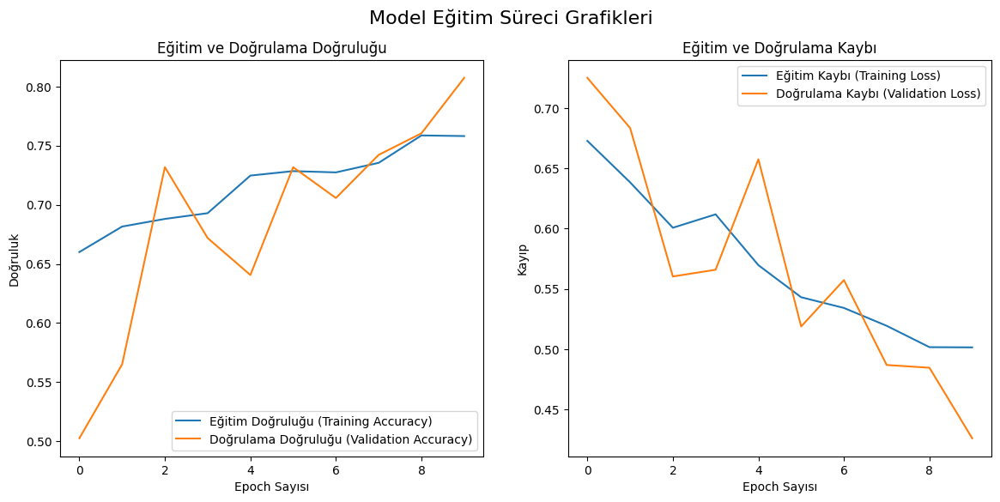

In [16]:
# eğitim sürecinden gelen 'history' nesnesini kullanalım
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

# Toplam epoch sayısını alalım
epochs_range = range(len(acc))

plt.figure(figsize=(14, 6))

# Doğruluk (Accuracy) Grafiği
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Eğitim Doğruluğu (Training Accuracy)')
plt.plot(epochs_range, val_acc, label='Doğrulama Doğruluğu (Validation Accuracy)')
plt.legend(loc='lower right')
plt.title('Eğitim ve Doğrulama Doğruluğu')
plt.xlabel('Epoch Sayısı')
plt.ylabel('Doğruluk')

# Kayıp (Loss) Grafiği
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Eğitim Kaybı (Training Loss)')
plt.plot(epochs_range, val_loss, label='Doğrulama Kaybı (Validation Loss)')
plt.legend(loc='upper right')
plt.title('Eğitim ve Doğrulama Kaybı')
plt.xlabel('Epoch Sayısı')
plt.ylabel('Kayıp')

plt.suptitle('Model Eğitim Süreci Grafikleri', fontsize=16)
plt.show()

# Test Seti Üzerinde Nihai Model Değerlendirmesi
---

Modelin eğitim ve doğrulama süreçleri tamamlandıktan sonra, onun gerçek dünya performansını ölçmek için son bir değerlendirme yapılması gerekir. Bu değerlendirme, modelin eğitim ve doğrulama sırasında hiç görmediği, tamamen bağımsız bir veri kümesi olan test seti üzerinde gerçekleştirilir. Bu, modelin genelleme yeteneğinin en adil ve en tarafsız ölçümüdür.

Bu işlem, Keras'ın **model.evaluate()** fonksiyonu kullanılarak yapılır. Bu fonksiyon, **test_generator**'dan gelen tüm verileri kullanarak modelin tahminlerini alır, bu tahminleri gerçek etiketlerle karşılaştırır ve derleme aşamasında belirtilen kayıp (loss) ve metrik (accuracy) değerlerini hesaplar.

---

**Sonuçların Anlamı**

**Test Seti Doğruluğu (Test Accuracy):** Bu, projenin en önemli nihai performans göstergesidir. Modelin, daha önce hiç karşılaşmadığı yangın ve yangın olmayan görüntülerde yüzde kaç oranında doğru sınıflandırma yaptığını belirtir. Bu skorun, doğrulama seti üzerinde elde edilen doğruluğa (val_accuracy) yakın olması, modelin başarılı bir şekilde genelleme yaptığını gösterir.

**Test Seti Kaybı (Test Loss):** Modelin test setindeki ortalama hata miktarıdır. Bu değerin düşük olması, modelin tahminlerinin gerçek değerlere oldukça yakın olduğunu ifade eder.

In [17]:
# model.evaluate() fonksiyonu, test seti üzerinde kayıp ve doğruluk değerlerini hesaplar.
print("\nTest veri seti üzerinde model performansı değerlendiriliyor...")
test_loss, test_accuracy = model.evaluate(test_generator, steps=len(test_generator))

print(f"\nTest Seti Doğruluk (Test Accuracy): {test_accuracy * 100:.2f}%")
print(f"Test Seti Kaybı (Test Loss): {test_loss:.4f}")


Test veri seti üzerinde model performansı değerlendiriliyor...
 2/12 ━━━━━━━━━━━━━━━━━━━━ 50s 5s/step - accuracy: 0.7734 - loss: 0.5454

[ WARN:45@6239.866] global grfmt_png.cpp:695 read_chunk chunk data is too large


12/12 ━━━━━━━━━━━━━━━━━━━━ 93s 8s/step - accuracy: 0.7827 - loss: 0.4637

Test Seti Doğruluk (Test Accuracy): 82.03%
Test Seti Kaybı (Test Loss): 0.3823


# Detaylı Performans Analizi: Karışıklık Matrisi ve Sınıflandırma Raporu
---

Genel doğruluk oranı, modelin performansı hakkında iyi bir ilk izlenim verse de, hangi sınıflarda başarılı olduğunu ve ne tür hatalar yaptığını anlamak için yeterli değildir. Bu nedenle, modelin test seti üzerindeki tahminleri daha derinlemesine analiz etmek amacıyla **Karışıklık Matrisi (Confusion Matrix)** ve **Sınıflandırma Raporu (Classification Report)** gibi güçlü değerlendirme araçları kullanılmıştır.

Bu analiz için öncelikle **model.predict()** fonksiyonu ile test setindeki tüm görüntüler için tahminler üretilmiş, ardından bu tahminler gerçek etiketlerle karşılaştırılmıştır.

---

**Karışıklık Matrisi (Confusion Matrix)**

Karışıklık matrisi, modelin sınıflandırma performansını görsel olarak özetleyen bir tablodur. Matrisin her bir hücresi, modelin yaptığı doğru ve yanlış tahminlerin sayısını gösterir:

**True Positive (TP - Gerçek Pozitif):** Gerçekte 'fire' olan ve modelin de 'fire' olarak doğru tahmin ettiği görüntü sayısı.

**True Negative (TN - Gerçek Negatif):** Gerçekte 'nofire' olan ve modelin de 'nofire' olarak doğru tahmin ettiği görüntü sayısı.

**False Positive (FP - Yanlış Pozitif):** Gerçekte 'nofire' olan ancak modelin 'fire' olarak yanlış tahmin ettiği görüntü sayısı (Tip-I Hata veya "Yanlış Alarm").

**False Negative (FN - Yanlış Negatif):** Gerçekte 'fire' olan ancak modelin 'nofire' olarak yanlış tahmin ettiği görüntü sayısı (Tip-II Hata veya "Gözden Kaçırma"). Orman yangını tespiti gibi kritik bir problemde en tehlikeli hata türü budur.

Bu matris, modelin hangi sınıfları birbiriyle karıştırdığını ve ne tür hatalara daha yatkın olduğunu net bir şekilde ortaya koyar.

---

**Sınıflandırma Raporu (Classification Report)**

Bu rapor, her bir sınıf için performansı ölçen daha detaylı metrikler sunar:

**Precision (Hassasiyet):** Modelin bir sınıf için yaptığı pozitif tahminlerin ne kadarının doğru olduğunu ölçer. Örneğin, "fire" sınıfı için precision, modelin "yangın var" dediği tüm görüntülerin gerçekte yüzde kaçının yangın olduğunu gösterir. Yüksek precision, düşük "yanlış alarm" oranı anlamına gelir.

**Recall (Duyarlılık / Geri Çağırma):** Bir sınıfa ait olan tüm örneklerin ne kadarının model tarafından doğru bir şekilde tespit edildiğini ölçer. "Fire" sınıfı için recall, gerçekteki tüm yangın vakalarının yüzde kaçını modelin yakalayabildiğini gösterir. Yüksek recall, düşük "gözden kaçırma" oranı anlamına gelir. Bu metrik, yangın tespiti gibi durumlarda genellikle en kritik olanıdır.

**F1-Score:** Precision ve Recall metriklerinin harmonik ortalamasıdır. Bu iki metrik arasında bir denge kurarak sınıflandırma performansını tek bir skorla özetler.

Test seti üzerinde tahminler yapılıyor...
 2/12 ━━━━━━━━━━━━━━━━━━━━ 48s 5s/step 

[ WARN:46@6343.829] global grfmt_png.cpp:695 read_chunk chunk data is too large


12/12 ━━━━━━━━━━━━━━━━━━━━ 93s 8s/step

Tahmin Sayısı: 384
Gerçek Etiket Sayısı: 384

Karışıklık Matrisi oluşturuluyor...


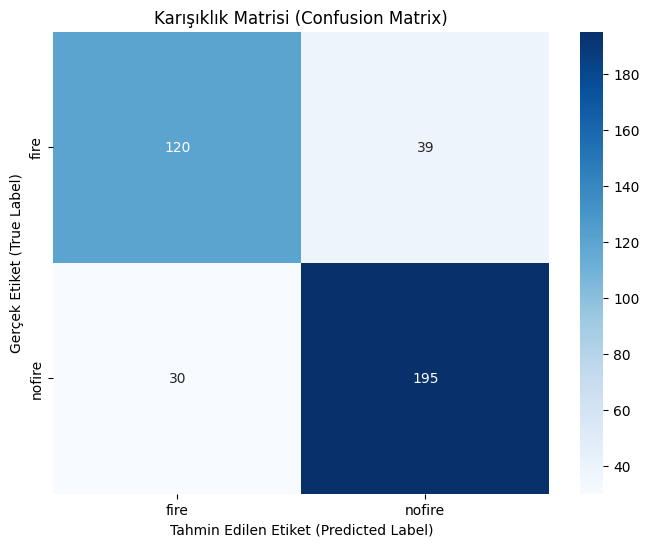


Sınıflandırma Raporu (Classification Report):

              precision    recall  f1-score   support

        fire       0.80      0.75      0.78       159
      nofire       0.83      0.87      0.85       225

    accuracy                           0.82       384
   macro avg       0.82      0.81      0.81       384
weighted avg       0.82      0.82      0.82       384



In [18]:
# Test setindeki tüm görüntüler için tahminler yap
print("Test seti üzerinde tahminler yapılıyor...")
y_pred_probs = model.predict(test_generator, steps=len(test_generator), verbose=1)

# Olasılıkları sınıf etiketlerine dönüştür (0.5 eşik değeri ile)
y_pred = (y_pred_probs > 0.5).astype("int32").reshape(-1)

y_true_full = test_generator.labels

# ÖNEMLİ: Bazen son batch tam dolmaz. Bu yüzden tahmin sayısı ile etiket sayısını eşleştirmeliyiz.
# Tahmin ettiğimiz görüntü sayısı kadar gerçek etiketi alıyoruz.
num_predictions = len(y_pred)
y_true = y_true_full[:num_predictions]

print(f"\nTahmin Sayısı: {len(y_pred)}")
print(f"Gerçek Etiket Sayısı: {len(y_true)}")

# Karışıklık Matrisini oluştur ve görselleştir
print("\nKarışıklık Matrisi oluşturuluyor...")
cm = confusion_matrix(y_true, y_pred)
class_labels = list(test_generator.class_indices.keys())

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Karışıklık Matrisi (Confusion Matrix)')
plt.ylabel('Gerçek Etiket (True Label)')
plt.xlabel('Tahmin Edilen Etiket (Predicted Label)')
plt.show()

# Sınıflandırma Raporunu yazdır
print("\nSınıflandırma Raporu (Classification Report):\n")
print(classification_report(y_true, y_pred, target_names=class_labels))

In [19]:
print("Eğitilmiş modelin SADECE AĞIRLIKLARI 'wildfire_model_weights.weights.h5' dosyasına kaydediliyor...")
model.save_weights('wildfire_model_weights.weights.h5')
print("✅ Ağırlıklar başarıyla kaydedildi.")

Eğitilmiş modelin SADECE AĞIRLIKLARI 'wildfire_model_weights.weights.h5' dosyasına kaydediliyor...
✅ Ağırlıklar başarıyla kaydedildi.


# Modelin Yorumlanabilirliği: Grad-CAM ile Odak Analizi
---

Derin öğrenme modelleri genellikle "kara kutu" olarak nitelendirilir; yani doğru tahminler yapsalar bile bu tahminleri hangi görsel kanıtlara dayanarak yaptıkları belirsiz olabilir. Modelin güvenilirliğini ve şeffaflığını artırmak için, bu projede **Grad-CAM (Gradient-weighted Class Activation Mapping)** adı verilen bir **Yorumlanabilir Yapay Zeka (Explainable AI - XAI)** tekniği kullanılmıştır.

Bu teknik, modelin bir karar verirken görüntünün hangi bölgelerine en çok "odaklandığını" veya hangi piksellerin bu kararda en etkili olduğunu gösteren bir **ısı haritası (heatmap)** oluşturur.

---

**Uygulama Süreci**
Grad-CAM'in, Sequential API ile oluşturulan modellerde bazen karşılaşılan içsel yapı sorunları nedeniyle hatasız çalışmasını garanti altına almak için, bu aşamada aşağıdaki adımlar izlenmiştir:

**Modelin Functional API ile Yeniden Oluşturulması:** Daha önce Sequential API ile tasarlanan modelin mimarisi, Keras'ın daha esnek ve yapısal olarak daha belirgin olan Functional API'si ile birebir aynı şekilde yeniden oluşturulmuştur. Bu, katmanlar arasındaki veri akışını net bir şekilde tanımlayarak Grad-CAM'in modelin iç katmanlarına sorunsuz erişmesini sağlar.

**Eğitilmiş Ağırlıkların Yüklenmesi:** Bu yeni ve sağlam mimarinin üzerine, daha önceki eğitim sürecinde öğrenilen ve diske kaydedilen (wildfire_model_weights.weights.h5) ağırlıklar yüklenmiştir. Bu sayede, modelin tüm öğrenilmiş bilgisi korunmuş olur.
**Yardımcı Fonksiyonların Tanımlanması:** Grad-CAM sürecini yönetmek için üç ana fonksiyon tanımlanmıştır:

--> **preprocess_image:** Bir görüntüyü modele girdi olarak verilecek doğru formata (boyutlandırma, normalleştirme) getirir.

--> **make_gradcam_heatmap:** Bir görüntü için modelin son evrişim katmanındaki gradyanları ve aktivasyonları kullanarak asıl ısı haritasını üretir.

--> **overlay_heatmap:** Üretilen bu ısı haritasını, orijinal görüntü üzerine yarı şeffaf bir şekilde bindirerek görselleştirmeyi kolaylaştırır.

**Görselleştirme:** Son olarak, test setinden rastgele seçilen fire ve nofire sınıfı görüntüleri üzerinde yukarıdaki fonksiyonlar çalıştırılmıştır. Her bir görüntü için modelin tahmini alınmış, Grad-CAM ısı haritası oluşturulmuş ve sonuçlar, gerçek ve tahmin edilen etiketlerle birlikte ekrana çizdirilmiştir.

--- Grad-CAM Süreci Başlatılıyor (Nihai Yöntem: Functional API) ---
✅ Model, Functional API ile temiz bir şekilde oluşturuldu.
✅ Ağırlıklar 'wildfire_model_weights.weights.h5' dosyasından başarıyla yüklendi.
✅ Gerekli tüm Grad-CAM fonksiyonları tanımlandı.

--- Isı Haritaları Oluşturuluyor... ---


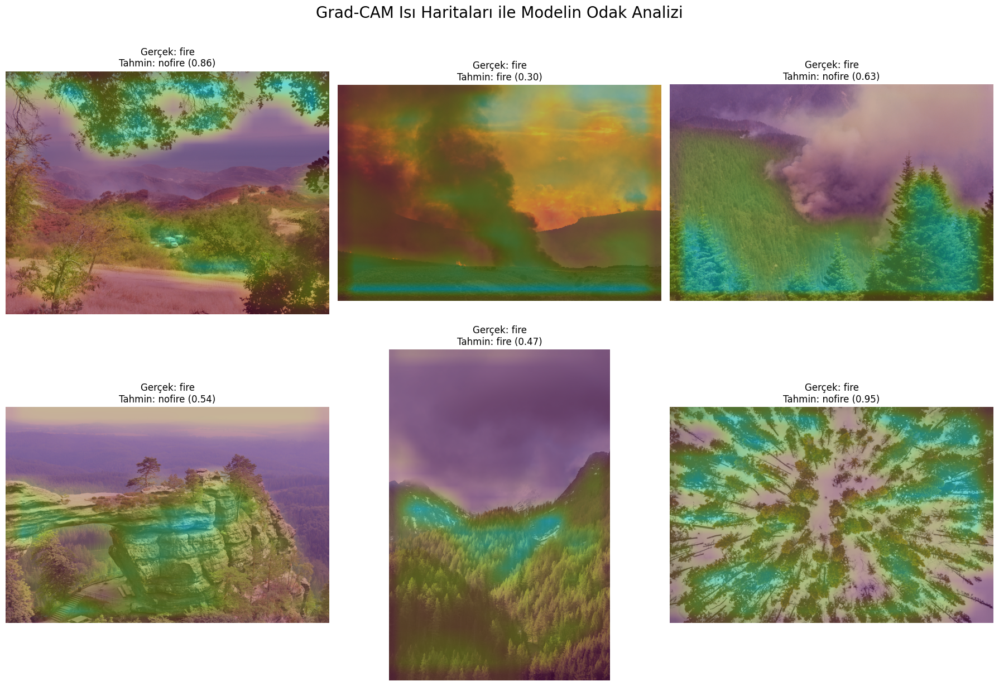


--- Süreç Tamamlandı ---


In [20]:
print("--- Grad-CAM Süreci Başlatılıyor (Nihai Yöntem: Functional API) ---")

# Gerekli değişkenler
IMG_HEIGHT = 224
IMG_WIDTH = 224

# Giriş katmanını tanımla
inputs = keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3))

# Katmanları birbirine bağla 
x = layers.Conv2D(32, (3, 3), padding="same")(inputs)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(pool_size=(2, 2))(x)

x = layers.Conv2D(64, (3, 3), padding="same")(x)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(pool_size=(2, 2))(x)

x = layers.Conv2D(128, (3, 3), padding="same")(x)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(pool_size=(2, 2))(x)

# SON EVRİŞİM KATMANI: Adını manuel olarak vererek daha sonra kolayca bulalım.

x = layers.Conv2D(128, (3, 3), padding="same", name="final_conv_layer")(x)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(pool_size=(2, 2))(x)

x = layers.Flatten()(x)
x = layers.Dense(512)(x)
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(1, activation="sigmoid")(x)

# Girdi ve çıktıları belirterek modeli oluştur
model_functional = Model(inputs=inputs, outputs=outputs)
print("✅ Model, Functional API ile temiz bir şekilde oluşturuldu.")

try:
    # Kaydedilmiş ağırlıkları bu yeni ve sağlam modele yükle
    model_functional.load_weights('wildfire_model_weights.weights.h5')
    print("✅ Ağırlıklar 'wildfire_model_weights.weights.h5' dosyasından başarıyla yüklendi.")
except Exception as e:
    print(f"HATA: Ağırlıklar yüklenemedi. Lütfen bir önceki 'model.save_weights()' adımını çalıştırdığınızdan emin olun. Hata detayı: {e}")

last_conv_layer_name = "final_conv_layer"

def preprocess_image(img_path, target_size=(224, 224)):
    img = cv2.imread(img_path)
    if img is None: return None
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, target_size)
    img_array = np.expand_dims(img, axis=0)
    img_array = img_array / 255.0
    return img_array

def overlay_heatmap(img_path, heatmap, alpha=0.5, colormap=cv2.COLORMAP_VIRIDIS):
    original_img = cv2.imread(img_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    heatmap = cv2.resize(heatmap, (original_img.shape[1], original_img.shape[0]))
    heatmap = (heatmap * 255).astype("uint8")
    heatmap = cv2.applyColorMap(heatmap, colormap)
    superimposed_img = cv2.addWeighted(original_img, 1 - alpha, heatmap, alpha, 0)
    return superimposed_img

def make_gradcam_heatmap(img_array, model, last_conv_layer_name):
    grad_model = Model(inputs=[model.inputs], outputs=[model.get_layer(last_conv_layer_name).output, model.output])
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        class_output = preds[0]
    grads = tape.gradient(class_output, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()

print("✅ Gerekli tüm Grad-CAM fonksiyonları tanımlandı.")

try:
    base_dir = '/kaggle/input/the-wildfire-dataset/the_wildfire_dataset_2n_version'
    test_dir = os.path.join(base_dir, 'test')
    class_labels = sorted(os.listdir(test_dir))

    fire_dir = os.path.join(test_dir, 'fire')
    nofire_dir = os.path.join(test_dir, 'nofire')
    fire_image_paths = [os.path.join(fire_dir, fname) for fname in random.sample(os.listdir(fire_dir), 3)]
    nofire_image_paths = [os.path.join(nofire_dir, fname) for fname in random.sample(os.listdir(nofire_dir), 3)]
    all_image_paths = fire_image_paths + nofire_image_paths

    plt.figure(figsize=(18, 12))
    print("\n--- Isı Haritaları Oluşturuluyor... ---")

    for i, img_path in enumerate(all_image_paths):
        img_array = preprocess_image(img_path)
        if img_array is None: continue

        preds = model_functional.predict(img_array, verbose=0)
        prediction_value = preds[0][0]
        predicted_class = class_labels[0] if prediction_value < 0.5 else class_labels[1]

        heatmap = make_gradcam_heatmap(img_array, model_functional, last_conv_layer_name)
        superimposed_img = overlay_heatmap(img_path, heatmap)
        
        true_class = "fire" if "fire" in img_path else "nofire"
        
        ax = plt.subplot(2, 3, i + 1)
        plt.imshow(superimposed_img)
        plt.title(f"Gerçek: {true_class}\nTahmin: {predicted_class} ({prediction_value:.2f})", fontsize=12)
        plt.axis('off')

    plt.tight_layout()
    plt.suptitle("Grad-CAM Isı Haritaları ile Modelin Odak Analizi", fontsize=20, y=1.02)
    plt.show()

except Exception as e:
    print(f"\n❌ Bir hata oluştu. 'test_dir' veya ağırlık dosyası ile ilgili bir sorun olabilir. Hata: {e}")

print("\n--- Süreç Tamamlandı ---")

**Sonuçların Yorumlanması**
Bu analizin çıktısı, her bir test görüntüsü için modelin karar anındaki "dikkat" haritasını sunar. Isı haritasındaki sıcak renkler (kırmızı, sarı), modelin o bölgedeki pikselleri kararını verirken daha önemli bulduğunu gösterir. İdeal bir senaryoda, modelin "fire" tahmini yaparken alevlerin veya dumanın olduğu bölgelere odaklanması beklenir. Bu görsel doğrulama, modelimizin sadece doğru tahminler yapmakla kalmayıp, bu tahminleri doğru ve mantıklı görsel kanıtlara dayanarak yaptığını teyit etmemizi sağlar. Bu da modelin güvenilirliği hakkında önemli bir kanıt sunar.

In [21]:
import keras_tuner as kt
print(f"Keras Tuner sürümü: {kt.__version__}")

Keras Tuner sürümü: 1.4.7


# Hiperparametre Optimizasyonu: En İyi Modelin Keşfi
---

Bir derin öğrenme modelinin performansı, sadece mimarisine değil, aynı zamanda eğitim başlamadan önce belirlenen bir dizi ayar olan hiperparametrelere de büyük ölçüde bağlıdır. **Öğrenme oranı (learning rate)**, **katman sayısı**, **filtre sayısı** ve **dropout oranı** gibi hiperparametrelerin doğru kombinasyonunu bulmak, modelin potansiyelini tam olarak ortaya çıkarmak için kritik bir adımdır.
Bu süreci manuel olarak yapmak (tek tek denemeler) hem zaman alıcı hem de verimsiz olabileceğinden, projede bu görevi otomatikleştirmek için **Keras Tuner** kütüphanesi kullanılmıştır.

**Hipermodel Oluşturma Fonksiyonu (build_hypermodel)**

**Keras Tuner** ile optimizasyon yapmanın ilk adımı, bir "**hipermodel**" tanımlamaktır. Bu, standart bir model tanımına benzer, ancak sabit değerler yerine, Keras Tuner'ın içinden seçim yapacağı arama aralıkları içerir. **build_hypermodel** fonksiyonu, bu amaçla oluşturulmuştur.

---

Bu fonksiyonun içinde, hp (hiperparametreler) nesnesi kullanılarak optimize edilmek istenen her bir ayar için bir arama alanı tanımlanmıştır:

**hp.Int('num_conv_layers', 2, 4):** Keras Tuner'a, modelde 2, 3 veya 4 adet evrişim bloğu denemesini söyler. Bu, modelin derinliğini optimize eder.

**hp.Int('conv_..._filters', ...):** Her bir evrişim katmanındaki filtre sayısını 32, 64, 96 veya 128 arasından denemesini sağlar. Bu, modelin özellik çıkarma kapasitesini ayarlar.

**hp.Int('dense_units', ...):** Sınıflandırma bölümündeki Dense katmanının nöron sayısını 128 ile 512 arasında denemesini belirtir.

**hp.Float('dropout_rate', ...):** Aşırı öğrenmeyi kontrol eden Dropout katmanının oranını 0.3 ile 0.6 arasında farklı değerlerle test eder.

**hp.Choice('learning_rate', ...):** Eğitimin en kritik hiperparametrelerinden olan öğrenme oranını, 0.001, 0.0001 ve 0.00001 gibi en yaygın ve etkili değerler arasından seçmesini sağlar.

**Keras Tuner**, daha sonraki adımlarda bu fonksiyondaki aralıklardan farklı kombinasyonlar seçerek otomatik olarak yeni modeller oluşturacak, bunları eğitecek ve en iyi sonucu vereni bize raporlayacaktır. Bu sistematik yaklaşım, en iyi performansa sahip model mimarisini ve eğitim yapılandırmasını keşfetmek için güçlü bir yöntemdir.

In [22]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model

def build_hypermodel(hp):
    """
    Keras Tuner için bir hipermodel oluşturur.
    Bu fonksiyon, denenecek hiperparametre aralıklarını içerir.
    """
    # --- GİRİŞ KATMANI ---
    inputs = keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3))
    
    x = inputs
    
    # --- EVRİŞİM BLOKLARI ---
    for i in range(hp.Int('num_conv_layers', 2, 4)): 
        x = layers.Conv2D(
            filters=hp.Int(f'conv_{i}_filters', min_value=32, max_value=128, step=32),
            kernel_size=3,
            padding='same'
        )(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation("relu")(x)
        x = layers.MaxPooling2D(pool_size=(2, 2))(x)
        
    # --- SINIFLANDIRMA BÖLÜMÜ ---
    x = layers.Flatten()(x)
    
    x = layers.Dense(
        units=hp.Int('dense_units', min_value=128, max_value=512, step=128),
        activation='relu'
    )(x)
    x = layers.BatchNormalization()(x)
    
    x = layers.Dropout(
        rate=hp.Float('dropout_rate', min_value=0.3, max_value=0.6, step=0.1)
    )(x)
    
    
    # Son Dense katmanını da bir önceki katmanın çıktısı olan 'x'e bağlıyoruz.
    outputs = layers.Dense(1, activation='sigmoid')(x)
    
    
    model = Model(inputs=inputs, outputs=outputs)
    
    # --- OPTIMIZER ---
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-3, 1e-4, 1e-5])
    
    model.compile(
        optimizer=Adam(learning_rate=hp_learning_rate),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    
    return model

print("✅ Düzeltilmiş hipermodel oluşturma fonksiyonu 'build_hypermodel' tanımlandı.")

✅ Düzeltilmiş hipermodel oluşturma fonksiyonu 'build_hypermodel' tanımlandı.


# Optimizasyon Stratejisinin Belirlenmesi:
---

**build_hypermodel** fonksiyonu ile optimize edilecek hiperparametrelerin arama alanı tanımlandıktan sonraki adım, Keras Tuner'a bu alanda nasıl bir arama stratejisi izleyeceğini belirtmektir. Bu projede, en popüler ve genellikle en verimli stratejilerden biri olan **RandomSearch (Rastgele Arama)** tercih edilmiştir.

RandomSearch, belirtilen arama alanından rastgele hiperparametre kombinasyonları seçerek modeller oluşturur ve eğitir. Bu yöntem, özellikle arama alanı geniş olduğunda ve hangi parametrelerin daha önemli olduğu başlangıçta bilinmediğinde, iyi sonuçları hızlı bir şekilde bulma eğilimindedir.

**Tuner'ın Yapılandırma Parametreleri**
**build_hypermodel:** Tuner'ın her denemede yeni bir model oluşturmak için kullanacağı, bir önceki adımda tanımlanan fonksiyondur.

**objective='val_accuracy':** Optimizasyonun nihai hedefini belirtir. Bu yapılandırma ile Keras Tuner, en yüksek doğrulama doğruluğunu (val_accuracy) elde eden hiperparametre kombinasyonunu bulmaya çalışacaktır. Bu, modelin ezber yapmasından ziyade genelleme yeteneğini önceliklendirdiğimiz anlamına gelir.

**max_trials=3:** Tuner'ın toplamda kaç farklı rastgele hiperparametre kombinasyonu deneyeceğini belirler. Bu proje için, sürecin hızlı bir şekilde gösterilmesi amacıyla bu değer 3 olarak ayarlanmıştır. Gerçek bir optimizasyon senaryosunda, daha iyi bir sonuç bulma olasılığını artırmak için bu değer artırılabilir (örneğin, 10, 20 veya daha fazla).

**executions_per_trial=1:** Her bir hiperparametre kombinasyonunun kaç kez eğitileceğini belirtir. Değerin 1 olması, her kombinasyonun bir kez eğitileceği anlamına gelir.
directory ve project_name: Keras Tuner'ın, her bir denemenin sonuçlarını (hiperparametreler, eğitim logları, kaydedilen modeller vb.) diske kaydedeceği klasör yapısını tanımlar. Bu, sürecin yarıda kesilmesi durumunda bile kaldığı yerden devam etmesine veya sonuçların daha sonra analiz edilmesine olanak tanır.

**tuner.search_space_summary()** komutu ise, arama başlamadan önce optimize edilecek tüm hiperparametrelerin adlarını ve arama alanlarını (örneğin, Int, Choice) listeleyerek yapılandırmanın doğru olup olmadığını kontrol etmemizi sağlar.

In [23]:
# RandomSearch Tuner'ı oluşturalım
tuner = kt.RandomSearch(
    build_hypermodel,
    objective='val_accuracy',
    max_trials=3,  # Toplamda 3 farklı model kombinasyonu dene
    executions_per_trial=1, # Her bir kombinasyonu 1 kez eğit. (Kararlılık için 2 yapılabilir)
    directory='keras_tuner_dir', # Sonuçların kaydedileceği klasör
    project_name='wildfire_optimization' # Proje adı
)

# Arama başlamadan önce arama alanının bir özetini görelim
tuner.search_space_summary()

Search space summary
Default search space size: 6
num_conv_layers (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 4, 'step': 1, 'sampling': 'linear'}
conv_0_filters (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 128, 'step': 32, 'sampling': 'linear'}
conv_1_filters (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 128, 'step': 32, 'sampling': 'linear'}
dense_units (Int)
{'default': None, 'conditions': [], 'min_value': 128, 'max_value': 512, 'step': 128, 'sampling': 'linear'}
dropout_rate (Float)
{'default': 0.3, 'conditions': [], 'min_value': 0.3, 'max_value': 0.6, 'step': 0.1, 'sampling': 'linear'}
learning_rate (Choice)
{'default': 0.001, 'conditions': [], 'values': [0.001, 0.0001, 1e-05], 'ordered': True}


# Hiperparametre Arama Sürecinin Başlatılması
---

Tuner yapılandırıldıktan sonra, **tuner.search()** fonksiyonu çağrılarak hiperparametre optimizasyon süreci fiilen başlatılır. Bu adım, standart bir **model.fit()** çağrısına çok benzer, ancak arka planda Keras Tuner, **max_trials** ile belirtilen sayıda farklı modeli otomatik olarak oluşturur, derler, eğitir ve değerlendirir.

Bu süreç, her bir model kombinasyonunu (trial) belirli bir epoch sayısı kadar eğittiği için, tek bir modelin eğitiminden önemli ölçüde daha uzun sürebilir.

**Akıllı Eğitim için EarlyStopping Callback'inin Kullanımı**

Arama sürecini daha verimli hale getirmek ve gereksiz hesaplamalardan kaçınmak için, Keras'ın EarlyStopping geri arama (callback) mekanizması kullanılmıştır. Bu callback, her bir denemenin (trial) performansını izler ve umut vaat etmeyen, yani öğrenmesi durmuş veya kötüleşmeye başlamış olan denemeleri erken sonlandırır.

**monitor='val_loss':** EarlyStopping, modelin doğrulama seti üzerindeki kayıp (val_loss) değerini izleyecektir.

**patience=3:** Eğer val_loss değeri 3 ardışık epoch boyunca iyileşme göstermezse (yani azalmazsa), Keras Tuner o denemeyi daha fazla devam ettirmenin anlamsız olduğuna karar verir ve eğitimi durdurarak bir sonraki rastgele kombinasyona geçer.

Bu strateji, kötü hiperparametre kombinasyonlarına sahip modellerin tam epoch sayısını tamamlamasını beklemeden elenmesini sağlayarak optimizasyon sürecini önemli ölçüde hızlandırır.

In [24]:
from tensorflow.keras.callbacks import EarlyStopping

print("\n🚀 Hiperparametre araması başlatılıyor... Bu işlem uzun sürebilir.")

# EarlyStopping callback'i tanımlayalım
# Doğrulama kaybı 3 epoch boyunca iyileşmezse denemeyi durdur.
stop_early = EarlyStopping(monitor='val_loss', patience=3)

# Aramayı başlatalım
tuner.search(
    train_generator,
    epochs=3, # Her bir denemeyi en fazla 3 epoch eğit
    validation_data=val_generator,
    callbacks=[stop_early]
)

print("\n🎉 Hiperparametre araması tamamlandı!")

Trial 3 Complete [00h 25m 15s]
val_accuracy: 0.40625

Best val_accuracy So Far: 0.5885416865348816
Total elapsed time: 01h 15m 37s

🎉 Hiperparametre araması tamamlandı!


# Optimizasyon Sonuçlarının Analizi ve En İyi Modelin Eğitilmesi
---

Hiperparametre arama süreci tamamlandıktan sonra, **Keras Tuner** tarafından toplanan veriler analiz edilerek en yüksek performansı **(val_accuracy)** gösteren model yapılandırması tespit edilir. Bu, projenin en optimize edilmiş modelini elde etmek için son adımdır.

**1. En İyi Hiperparametrelerin Alınması**
**tuner.get_best_hyperparameters()** fonksiyonu, arama sürecindeki tüm denemeleri (trials) objective (amaç) metriğine göre sıralar ve en iyi sonucu veren hiperparametre setlerini bir liste olarak döndürür. Bu sayede, en yüksek doğrulama doğruluğunu elde eden kombinasyon kolayca belirlenebilir.

**2. En İyi Modelin Alınması ve Final Eğitimi**

En iyi hiperparametreler belirlendikten sonra, **tuner.get_best_models()** fonksiyonu kullanılarak bu parametrelerle oluşturulmuş ve arama sırasında kısa bir süre eğitilmiş olan en iyi model nesnesi alınır.
Ancak, arama sırasındaki eğitim (örneğin 15 epoch), modelin tam potansiyeline ulaşması için genellikle yeterli değildir. Bu nedenle, en iyi hiperparametre kombinasyonuna sahip bu model, daha yüksek bir epoch sayısı ile yeniden ve son bir kez eğitilir. Bu "final eğitim", optimize edilmiş modelin veri setindeki desenleri tam olarak öğrenmesini ve en yüksek performansa ulaşmasını sağlar. Bu son eğitimde de, aşırı öğrenmeyi (overfitting) önlemek amacıyla yine **EarlyStopping callback**'i kullanılır.

In [25]:
# En iyi sonucu veren ilk 3 hiperparametre setini alalım
best_hps_list = tuner.get_best_hyperparameters(num_trials=3)

print("\n--- En İyi Hiperparametreler ---")
# En iyi olanı (ilkini) detaylı yazdıralım
best_hps = best_hps_list[0]
print(f"En iyi öğrenme oranı (learning_rate): {best_hps.get('learning_rate')}")
print(f"En iyi evrişim bloğu sayısı (num_conv_layers): {best_hps.get('num_conv_layers')}")
print(f"En iyi yoğun katman nöron sayısı (dense_units): {best_hps.get('dense_units')}")
print(f"En iyi dropout oranı (dropout_rate): {best_hps.get('dropout_rate')}")

# En iyi modeli alalım
best_model = tuner.get_best_models(num_models=1)[0]

# En iyi modeli, bulduğumuz hiperparametrelerle, daha uzun bir süre (final eğitim) eğitelim
print("\n--- En İyi Modelin Final Eğitimi Başlatılıyor ---")

# En iyi modeli al ve daha fazla epoch için eğit.
final_history = best_model.fit(
    train_generator,
    epochs=10, # Final eğitim için daha yüksek bir epoch sayısı
    validation_data=val_generator,
    callbacks=[stop_early] # Yine EarlyStopping kullanalım
)


--- En İyi Hiperparametreler ---
En iyi öğrenme oranı (learning_rate): 1e-05
En iyi evrişim bloğu sayısı (num_conv_layers): 2
En iyi yoğun katman nöron sayısı (dense_units): 128
En iyi dropout oranı (dropout_rate): 0.5

--- En İyi Modelin Final Eğitimi Başlatılıyor ---
Epoch 1/10
16/58 ━━━━━━━━━━━━━━━━━━━━ 4:27 6s/step - accuracy: 0.6698 - loss: 0.6692

[ WARN:84@11111.891] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


33/58 ━━━━━━━━━━━━━━━━━━━━ 2:44 7s/step - accuracy: 0.6630 - loss: 0.6915

Invalid SOS parameters for sequential JPEG
Invalid SOS parameters for sequential JPEG


40/58 ━━━━━━━━━━━━━━━━━━━━ 1:59 7s/step - accuracy: 0.6631 - loss: 0.6934

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


57/58 ━━━━━━━━━━━━━━━━━━━━ 6s 7s/step - accuracy: 0.6633 - loss: 0.6959 

[ WARN:85@11401.126] global grfmt_png.cpp:695 read_chunk chunk data is too large


58/58 ━━━━━━━━━━━━━━━━━━━━ 497s 8s/step - accuracy: 0.6633 - loss: 0.6960 - val_accuracy: 0.7083 - val_loss: 0.5862
Epoch 2/10
 4/58 ━━━━━━━━━━━━━━━━━━━━ 6:43 7s/step - accuracy: 0.6569 - loss: 0.7239

[ WARN:88@11535.112] global grfmt_png.cpp:695 read_chunk chunk data is too large
[ WARN:88@11537.179] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


10/58 ━━━━━━━━━━━━━━━━━━━━ 5:27 7s/step - accuracy: 0.6631 - loss: 0.7009

Invalid SOS parameters for sequential JPEG


51/58 ━━━━━━━━━━━━━━━━━━━━ 51s 7s/step - accuracy: 0.6641 - loss: 0.6920

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 515s 9s/step - accuracy: 0.6648 - loss: 0.6909 - val_accuracy: 0.5911 - val_loss: 0.7109
Epoch 3/10
 7/58 ━━━━━━━━━━━━━━━━━━━━ 6:24 8s/step - accuracy: 0.7197 - loss: 0.5735

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


18/58 ━━━━━━━━━━━━━━━━━━━━ 4:45 7s/step - accuracy: 0.7182 - loss: 0.5939

Invalid SOS parameters for sequential JPEG


23/58 ━━━━━━━━━━━━━━━━━━━━ 4:06 7s/step - accuracy: 0.7135 - loss: 0.6011

Invalid SOS parameters for sequential JPEG


25/58 ━━━━━━━━━━━━━━━━━━━━ 3:54 7s/step - accuracy: 0.7115 - loss: 0.6036

[ WARN:93@12197.503] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


31/58 ━━━━━━━━━━━━━━━━━━━━ 3:14 7s/step - accuracy: 0.7055 - loss: 0.6106

[ WARN:93@12238.478] global grfmt_png.cpp:695 read_chunk chunk data is too large


58/58 ━━━━━━━━━━━━━━━━━━━━ 501s 9s/step - accuracy: 0.6899 - loss: 0.6303 - val_accuracy: 0.5599 - val_loss: 0.7713
Epoch 4/10


Invalid SOS parameters for sequential JPEG


24/58 ━━━━━━━━━━━━━━━━━━━━ 4:03 7s/step - accuracy: 0.7086 - loss: 0.6507

Invalid SOS parameters for sequential JPEG


28/58 ━━━━━━━━━━━━━━━━━━━━ 3:28 7s/step - accuracy: 0.7077 - loss: 0.6479

[ WARN:96@12712.870] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


34/58 ━━━━━━━━━━━━━━━━━━━━ 2:50 7s/step - accuracy: 0.7055 - loss: 0.6455

[ WARN:97@12761.573] global grfmt_png.cpp:695 read_chunk chunk data is too large


36/58 ━━━━━━━━━━━━━━━━━━━━ 2:35 7s/step - accuracy: 0.7051 - loss: 0.6444

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


58/58 ━━━━━━━━━━━━━━━━━━━━ 496s 9s/step - accuracy: 0.6964 - loss: 0.6427 - val_accuracy: 0.7240 - val_loss: 0.5546
Epoch 5/10
 5/58 ━━━━━━━━━━━━━━━━━━━━ 6:12 7s/step - accuracy: 0.6753 - loss: 0.6595

Invalid SOS parameters for sequential JPEG


 9/58 ━━━━━━━━━━━━━━━━━━━━ 5:28 7s/step - accuracy: 0.6688 - loss: 0.6569

[ WARN:100@13074.837] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


32/58 ━━━━━━━━━━━━━━━━━━━━ 3:00 7s/step - accuracy: 0.6742 - loss: 0.6492

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50
[ WARN:101@13236.719] global grfmt_png.cpp:695 read_chunk chunk data is too large


48/58 ━━━━━━━━━━━━━━━━━━━━ 1:12 7s/step - accuracy: 0.6776 - loss: 0.6433

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 512s 9s/step - accuracy: 0.6801 - loss: 0.6405 - val_accuracy: 0.7344 - val_loss: 0.5066
Epoch 6/10
 2/58 ━━━━━━━━━━━━━━━━━━━━ 7:35 8s/step - accuracy: 0.6797 - loss: 0.6402

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


27/58 ━━━━━━━━━━━━━━━━━━━━ 3:55 8s/step - accuracy: 0.6895 - loss: 0.6265

Invalid SOS parameters for sequential JPEG


39/58 ━━━━━━━━━━━━━━━━━━━━ 2:21 7s/step - accuracy: 0.6913 - loss: 0.6237

[ WARN:104@13817.032] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


40/58 ━━━━━━━━━━━━━━━━━━━━ 2:13 7s/step - accuracy: 0.6914 - loss: 0.6234

[ WARN:105@13824.032] global grfmt_png.cpp:695 read_chunk chunk data is too large


48/58 ━━━━━━━━━━━━━━━━━━━━ 1:15 8s/step - accuracy: 0.6919 - loss: 0.6228

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 509s 9s/step - accuracy: 0.6922 - loss: 0.6226 - val_accuracy: 0.7161 - val_loss: 0.5354
Epoch 7/10
 4/58 ━━━━━━━━━━━━━━━━━━━━ 6:33 7s/step - accuracy: 0.6562 - loss: 0.8063

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


31/58 ━━━━━━━━━━━━━━━━━━━━ 3:09 7s/step - accuracy: 0.6918 - loss: 0.6572

[ WARN:109@14256.609] global grfmt_png.cpp:695 read_chunk chunk data is too large


34/58 ━━━━━━━━━━━━━━━━━━━━ 2:48 7s/step - accuracy: 0.6918 - loss: 0.6533

Invalid SOS parameters for sequential JPEG


40/58 ━━━━━━━━━━━━━━━━━━━━ 2:08 7s/step - accuracy: 0.6919 - loss: 0.6465

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 502s 9s/step - accuracy: 0.6920 - loss: 0.6373 - val_accuracy: 0.7552 - val_loss: 0.4872
Epoch 8/10
11/58 ━━━━━━━━━━━━━━━━━━━━ 5:53 8s/step - accuracy: 0.7109 - loss: 0.5854

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


12/58 ━━━━━━━━━━━━━━━━━━━━ 5:38 7s/step - accuracy: 0.7103 - loss: 0.5868

Invalid SOS parameters for sequential JPEG


42/58 ━━━━━━━━━━━━━━━━━━━━ 1:53 7s/step - accuracy: 0.6966 - loss: 0.6200

[ WARN:112@14835.655] global grfmt_png.cpp:695 read_chunk chunk data is too large


52/58 ━━━━━━━━━━━━━━━━━━━━ 42s 7s/step - accuracy: 0.6951 - loss: 0.6225

[ WARN:113@14905.630] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


54/58 ━━━━━━━━━━━━━━━━━━━━ 28s 7s/step - accuracy: 0.6948 - loss: 0.6229

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 504s 9s/step - accuracy: 0.6941 - loss: 0.6238 - val_accuracy: 0.7656 - val_loss: 0.4904
Epoch 9/10
13/58 ━━━━━━━━━━━━━━━━━━━━ 5:20 7s/step - accuracy: 0.6900 - loss: 0.6573

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


16/58 ━━━━━━━━━━━━━━━━━━━━ 4:45 7s/step - accuracy: 0.6926 - loss: 0.6551

Invalid SOS parameters for sequential JPEG


25/58 ━━━━━━━━━━━━━━━━━━━━ 3:45 7s/step - accuracy: 0.6961 - loss: 0.6537

[ WARN:117@15211.346] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


33/58 ━━━━━━━━━━━━━━━━━━━━ 2:58 7s/step - accuracy: 0.6981 - loss: 0.6494

[ WARN:117@15275.917] global grfmt_png.cpp:695 read_chunk chunk data is too large


53/58 ━━━━━━━━━━━━━━━━━━━━ 36s 7s/step - accuracy: 0.6984 - loss: 0.6491

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 519s 9s/step - accuracy: 0.6978 - loss: 0.6495 - val_accuracy: 0.7630 - val_loss: 0.4816
Epoch 10/10
16/58 ━━━━━━━━━━━━━━━━━━━━ 5:12 7s/step - accuracy: 0.6750 - loss: 0.7301

Invalid SOS parameters for sequential JPEG


31/58 ━━━━━━━━━━━━━━━━━━━━ 3:31 8s/step - accuracy: 0.6888 - loss: 0.6884

Invalid SOS parameters for sequential JPEG


37/58 ━━━━━━━━━━━━━━━━━━━━ 2:42 8s/step - accuracy: 0.6925 - loss: 0.6791

[ WARN:121@15852.144] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


51/58 ━━━━━━━━━━━━━━━━━━━━ 54s 8s/step - accuracy: 0.6984 - loss: 0.6628 

[ WARN:121@15957.776] global grfmt_png.cpp:695 read_chunk chunk data is too large


58/58 ━━━━━━━━━━━━━━━━━━━━ 555s 10s/step - accuracy: 0.6995 - loss: 0.6565 - val_accuracy: 0.7760 - val_loss: 0.4590


# Optimize Edilmiş Modelin Nihai Değerlendirmesi ve Yorumlanması
---

Hiperparametre optimizasyonu sonucunda elde edilen ve projenin en iyi performans gösteren versiyonu olan best_model, bu son bölümde kapsamlı bir analizden geçirilmiştir. Bu analiz, modelin sadece sayısal başarısını ölçmekle kalmaz, aynı zamanda öğrenme davranışını, zayıf noktalarını ve karar verme mekanizmasını da inceler.

**Analiz Adımları**

**Öğrenme Süreci Grafikleri:** Optimizasyon sonrası yapılan final eğitimine ait **final_history** nesnesi kullanılarak, modelin eğitim ve doğrulama setleri üzerindeki doğruluk (**accuracy**) ve kayıp (**loss**) eğrileri çizdirilmiştir. Bu grafikler, optimize edilmiş modelin öğrenme sürecinin ne kadar sağlıklı olduğunu ve aşırı öğrenmeye (**overfitting**) karşı ne kadar dirençli olduğunu görsel olarak teyit etmemizi sağlar.

**Test Seti Performansı:** Modelin gerçek dünya performansını ölçmek için, daha önce hiç görmediği test seti üzerinde **best_model.evaluate()** fonksiyonu çalıştırılmıştır. Bu işlemin sonucunda elde edilen Test Seti Doğruluğu ve Test Seti Kaybı, projenin en önemli nihai başarı metrikleridir.

**Karışıklık Matrisi ve Sınıflandırma Raporu:** Modelin hangi sınıflarda daha başarılı olduğunu ve ne tür hatalar yaptığını detaylı bir şekilde anlamak için test seti tahminleri üzerinden bir Karışıklık Matrisi ve Sınıflandırma Raporu oluşturulmuştur. Bu analiz, özellikle "yangın" gibi kritik bir sınıfı gözden kaçırma (False Negative) oranını ve "yanlış alarm" (False Positive) oranını net bir şekilde ortaya koyar.

**Hata Analizi ("Hall of Shame"):** Modelin test setinde yanlış sınıflandırdığı örnekler özel olarak tespit edilip görselleştirilmiştir. Bu "hatalar galerisi", modelin hangi tür görsellerde zorlandığını (örneğin, gün batımı, sisli hava veya belirli duman tipleri) anlamak için paha biçilmez bir araçtır. Bu analiz, gelecekteki veri toplama ve model iyileştirme çalışmaları için yol gösterir.

**Grad-CAM ile Yorumlanabilirlik Analizi:** Son olarak, best_model'in bir karar verirken görüntünün hangi bölgelerine odaklandığını anlamak için Grad-CAM tekniği uygulanmıştır. Test setinden rastgele seçilen örnekler üzerinde oluşturulan ısı haritaları, modelin tahminlerini mantıklı görsel kanıtlara (alevler, duman vb.) dayandırıp dayandırmadığını doğrulamamızı sağlar. Bu, modelin şeffaflığını ve güvenilirliğini artıran kritik bir adımdır.

Bu beş aşamalı kapsamlı analiz, hiperparametre optimizasyonu ile elde edilen nihai modelin performansını her açıdan değerlendirerek projenin başarısını somut verilerle ve görsellerle kanıtlar.

--- Optimize Edilmiş Modelin Performans Analizi Başlatılıyor ---

[1/5] Öğrenme süreci grafikleri çizdiriliyor...


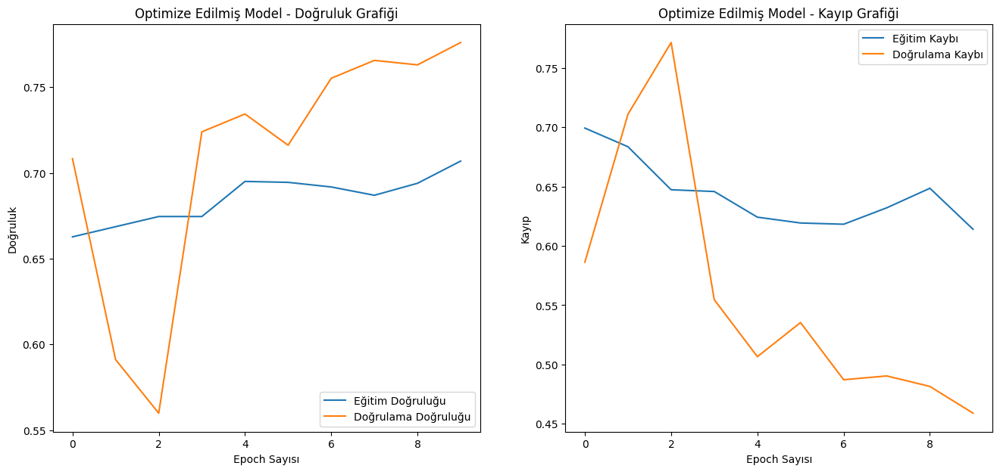


[2/5] Test seti üzerinde nihai performans değerlendiriliyor...


[ WARN:125@16139.753] global grfmt_png.cpp:695 read_chunk chunk data is too large


  -> Test Seti Doğruluğu: 83.59%
  -> Test Seti Kaybı: 0.3972

[3/5] Karışıklık Matrisi ve Sınıflandırma Raporu oluşturuluyor...


[ WARN:126@16255.976] global grfmt_png.cpp:695 read_chunk chunk data is too large


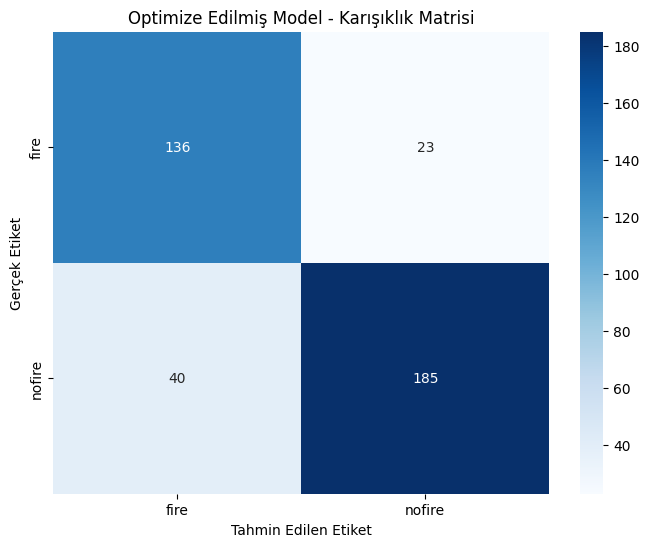


Optimize Edilmiş Model - Sınıflandırma Raporu:

              precision    recall  f1-score   support

        fire       0.77      0.86      0.81       159
      nofire       0.89      0.82      0.85       225

    accuracy                           0.84       384
   macro avg       0.83      0.84      0.83       384
weighted avg       0.84      0.84      0.84       384


[4/5] Modelin hatalı sınıflandırdığı örnekler inceleniyor...


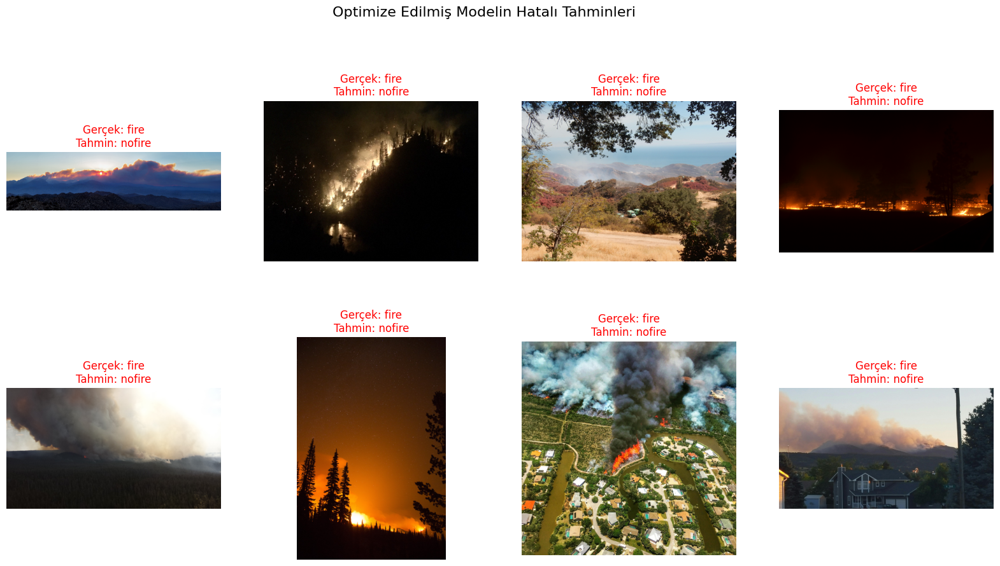


[5/5] Grad-CAM ile modelin odak analizi yapılıyor...
  -> Hedef katman bulundu: 'conv2d_1'


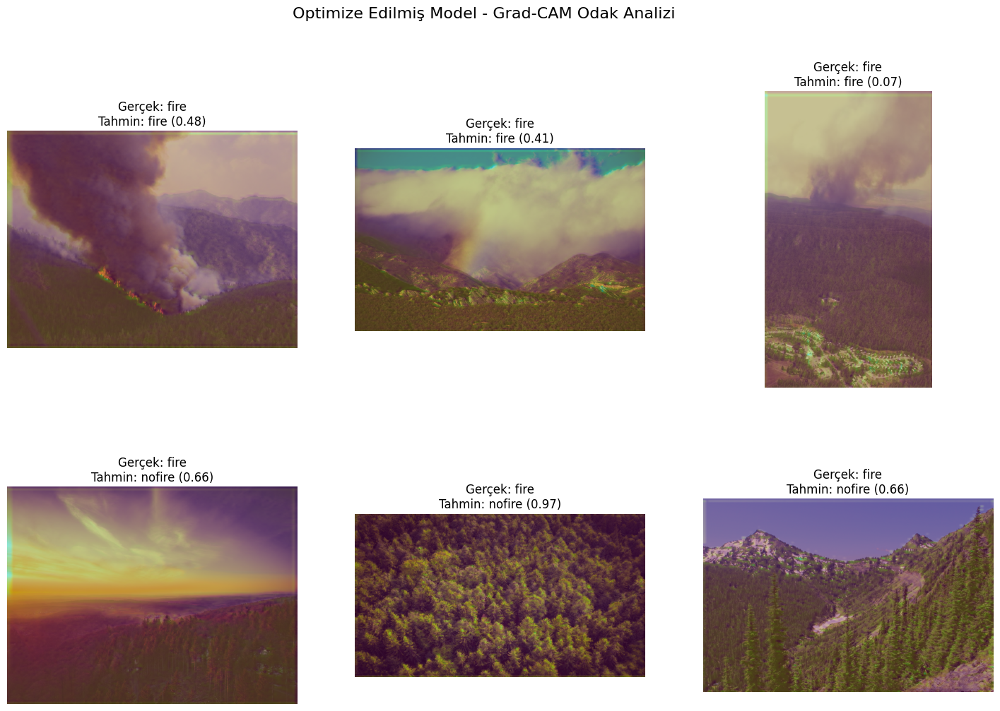


--- Tüm Analizler Tamamlandı ---


In [26]:
print("--- Optimize Edilmiş Modelin Performans Analizi Başlatılıyor ---")

print("\n[1/5] Öğrenme süreci grafikleri çizdiriliyor...")

# 'final_history' nesnesini kullanarak grafikleri çizelim
acc = final_history.history['accuracy']
val_acc = final_history.history['val_accuracy']
loss = final_history.history['loss']
val_loss = final_history.history['val_loss']
epochs_range = range(len(acc))

plt.figure(figsize=(16, 7))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Eğitim Doğruluğu')
plt.plot(epochs_range, val_acc, label='Doğrulama Doğruluğu')
plt.legend(loc='lower right')
plt.title('Optimize Edilmiş Model - Doğruluk Grafiği')
plt.xlabel('Epoch Sayısı')
plt.ylabel('Doğruluk')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Eğitim Kaybı')
plt.plot(epochs_range, val_loss, label='Doğrulama Kaybı')
plt.legend(loc='upper right')
plt.title('Optimize Edilmiş Model - Kayıp Grafiği')
plt.xlabel('Epoch Sayısı')
plt.ylabel('Kayıp')
plt.show()

print("\n[2/5] Test seti üzerinde nihai performans değerlendiriliyor...")
test_loss, test_accuracy = best_model.evaluate(test_generator, steps=len(test_generator), verbose=0)
print(f"  -> Test Seti Doğruluğu: {test_accuracy * 100:.2f}%")
print(f"  -> Test Seti Kaybı: {test_loss:.4f}")

print("\n[3/5] Karışıklık Matrisi ve Sınıflandırma Raporu oluşturuluyor...")

# Tahminleri al
y_pred_probs = best_model.predict(test_generator, steps=len(test_generator), verbose=0)
y_pred = (y_pred_probs > 0.5).astype("int32").reshape(-1)
y_true = test_generator.labels[:len(y_pred)]
class_labels = list(test_generator.class_indices.keys())

# Karışıklık Matrisini çizdir
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Optimize Edilmiş Model - Karışıklık Matrisi')
plt.ylabel('Gerçek Etiket')
plt.xlabel('Tahmin Edilen Etiket')
plt.show()

# Sınıflandırma Raporunu yazdır
print("\nOptimize Edilmiş Model - Sınıflandırma Raporu:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))

print("\n[4/5] Modelin hatalı sınıflandırdığı örnekler inceleniyor...")
misclassified_indices = np.where(y_pred != y_true)[0]
misclassified_paths = [test_generator.image_paths[i] for i in misclassified_indices]

if misclassified_paths:
    plt.figure(figsize=(20, 10))
    num_to_show = min(len(misclassified_paths), 8)
    for i in range(num_to_show):
        ax = plt.subplot(2, 4, i + 1)
        img_path = misclassified_paths[i]
        true_label_index = test_generator.labels[misclassified_indices[i]]
        predicted_label_index = y_pred[misclassified_indices[i]]
        
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.title(f"Gerçek: {class_labels[true_label_index]}\nTahmin: {class_labels[predicted_label_index]}", color='red')
        plt.axis('off')
    plt.suptitle("Optimize Edilmiş Modelin Hatalı Tahminleri", fontsize=16)
    plt.show()
else:
    print("  -> Harika! Model test setinde hiç hata yapmadı.")

print("\n[5/5] Grad-CAM ile modelin odak analizi yapılıyor...")

# Grad-CAM için gerekli fonksiyonları (preprocess_image, overlay_heatmap, make_gradcam_heatmap)
# daha önceki hücrelerde tanımladığımızı varsayıyoruz.
last_conv_layer_name = None
for layer in reversed(best_model.layers):
    if isinstance(layer, layers.Conv2D):
        last_conv_layer_name = layer.name
        break

if last_conv_layer_name:
    print(f"  -> Hedef katman bulundu: '{last_conv_layer_name}'")
    fire_image_paths = [os.path.join(test_dir, 'fire', fname) for fname in random.sample(os.listdir(os.path.join(test_dir, 'fire')), 3)]
    nofire_image_paths = [os.path.join(test_dir, 'nofire', fname) for fname in random.sample(os.listdir(os.path.join(test_dir, 'nofire')), 3)]
    all_image_paths = fire_image_paths + nofire_image_paths

    plt.figure(figsize=(18, 12))
    for i, img_path in enumerate(all_image_paths):
        img_array = preprocess_image(img_path)
        if img_array is None: continue

        preds = best_model.predict(img_array, verbose=0)
        prediction_value = preds[0][0]
        predicted_class = class_labels[0] if prediction_value < 0.5 else class_labels[1]

        heatmap = make_gradcam_heatmap(img_array, best_model, last_conv_layer_name)
        superimposed_img = overlay_heatmap(img_path, heatmap)
        
        true_class = "fire" if "fire" in img_path else "nofire"
        
        ax = plt.subplot(2, 3, i + 1)
        plt.imshow(superimposed_img)
        plt.title(f"Gerçek: {true_class}\nTahmin: {predicted_class} ({prediction_value:.2f})")
        plt.axis('off')
    plt.suptitle("Optimize Edilmiş Model - Grad-CAM Odak Analizi", fontsize=16)
    plt.show()
else:
    print("  -> UYARI: Grad-CAM için evrişim katmanı bulunamadı.")
    
print("\n--- Tüm Analizler Tamamlandı ---")

# Plotly ile Etkileşimli Eğitim Grafikleri
---

Bu grafikler, standart Matplotlib grafiklerinin aksine, fare imlecini üzerine getirdiğinizde her bir epoch'a ait accuracy ve loss değerlerini tam olarak görmenizi sağlar. 

In [27]:
# Plotly kütüphanesini yükleyelim
!pip install -q plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [28]:

print("--- Plotly ile Etkileşimli Eğitim Grafikleri Oluşturuluyor ---")

# History nesnesinden verileri alalım
acc = final_history.history['accuracy']
val_acc = final_history.history['val_accuracy']
loss = final_history.history['loss']
val_loss = final_history.history['val_loss']
epochs_range = list(range(1, len(acc) + 1)) # Epochları 1'den başlatmak daha sezgiseldir

# 1 satır ve 2 sütundan oluşan bir subplot figürü oluşturalım
fig = make_subplots(rows=1, cols=2, subplot_titles=('Model Doğruluk Grafiği', 'Model Kayıp Grafiği'))

# --- Doğruluk Grafiği ---
# Eğitim doğruluğu çizgisini ekle
fig.add_trace(
    go.Scatter(x=epochs_range, y=acc, mode='lines', name='Eğitim Doğruluğu'),
    row=1, col=1
)
# Doğrulama doğruluğu çizgisini ekle
fig.add_trace(
    go.Scatter(x=epochs_range, y=val_acc, mode='lines', name='Doğrulama Doğruluğu'),
    row=1, col=1
)

# --- Kayıp Grafiği ---
# Eğitim kaybı çizgisini ekle
fig.add_trace(
    go.Scatter(x=epochs_range, y=loss, mode='lines', name='Eğitim Kaybı'),
    row=1, col=2
)
# Doğrulama kaybı çizgisini ekle
fig.add_trace(
    go.Scatter(x=epochs_range, y=val_loss, mode='lines', name='Doğrulama Kaybı'),
    row=1, col=2
)

# Figürün genel düzenini ve etiketlerini güncelle
fig.update_layout(
    title_text='Optimize Edilmiş Modelin Etkileşimli Eğitim Süreci Analizi',
    height=500,
    width=1200
)
fig.update_xaxes(title_text='Epoch Sayısı', row=1, col=1)
fig.update_yaxes(title_text='Doğruluk', row=1, col=1)
fig.update_xaxes(title_text='Epoch Sayısı', row=1, col=2)
fig.update_yaxes(title_text='Kayıp', row=1, col=2)

# Figürü göster
fig.show()

--- Plotly ile Etkileşimli Eğitim Grafikleri Oluşturuluyor ---


# ROC Eğrisi ve AUC Skoru

**ROC Eğrisi (Receiver Operating Characteristic Curve)**, bir sınıflandırma modelinin performansını farklı eşik değerlerinde (thresholds) görselleştiren bir grafiktir.

**Y Ekseni:** True Positive Rate (TPR) veya Recall (Duyarlılık). (Gerçek yangınların ne kadarını doğru tespit ettik?)

**X Ekseni:** False Positive Rate (FPR). (Yangın olmayan kaç görüntüye yanlışlıkla yangın dedik?)
İdeal bir model, sol üst köşeye mümkün olduğunca yakın bir eğri çizer. Bu, yüksek bir True Positive oranına ve düşük bir False Positive oranına sahip olduğu anlamına gelir.

**AUC (Area Under the Curve)**, bu eğrinin altında kalan alandır.

--> AUC = 1.0: Mükemmel sınıflandırıcı.

--> AUC = 0.5: Rastgele tahminden farksız (işe yaramaz) bir sınıflandırıcı.

--> 0.5 < AUC < 1.0: Modelin ne kadar iyi olduğunu gösteren bir skordur. 0.9'un üzeri genellikle çok iyi kabul edilir.


--- ROC Eğrisi ve AUC Skoru Hesaplanıyor ---


[ WARN:128@16403.610] global grfmt_png.cpp:695 read_chunk chunk data is too large


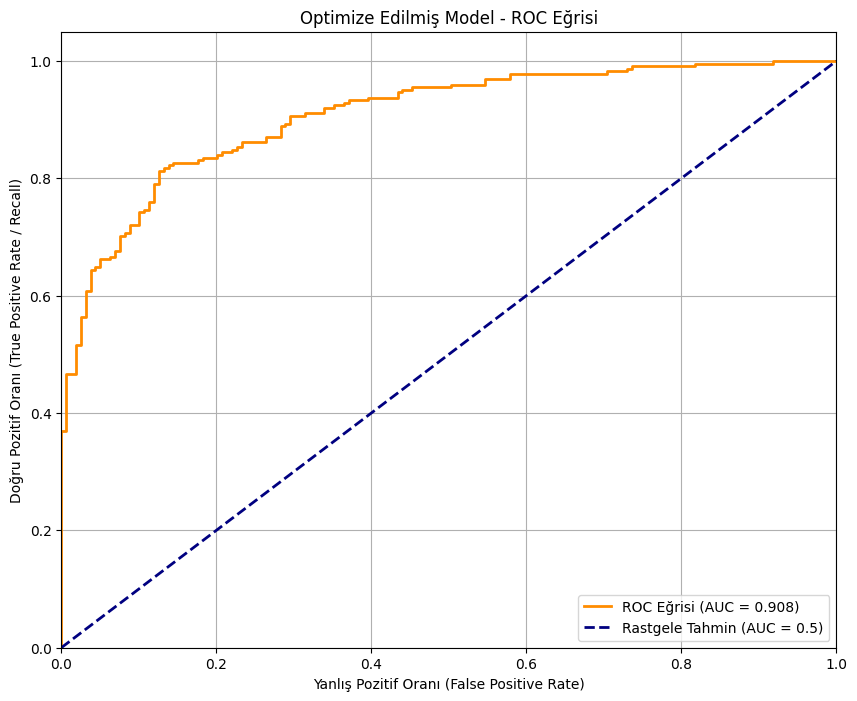


Modelin AUC skoru: 0.9081


In [29]:
from sklearn.metrics import roc_curve, auc

print("\n--- ROC Eğrisi ve AUC Skoru Hesaplanıyor ---")

# 'best_model' ve 'test_generator'ın daha önce oluşturulduğunu varsayıyoruz.
# Modelin olasılık tahminlerini alalım (henüz 0/1'e çevrilmemiş hali)
y_pred_probs = best_model.predict(test_generator, steps=len(test_generator), verbose=0).ravel()
y_true = test_generator.labels[:len(y_pred_probs)]

# ROC eğrisi için FPR, TPR ve eşik değerlerini hesaplayalım
fpr, tpr, thresholds = roc_curve(y_true, y_pred_probs)

# Eğrinin altında kalan alanı (AUC) hesaplayalım
roc_auc = auc(fpr, tpr)

# Grafiği çizdirelim
plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Eğrisi (AUC = {roc_auc:.3f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Rastgele Tahmin (AUC = 0.5)')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Yanlış Pozitif Oranı (False Positive Rate)')
plt.ylabel('Doğru Pozitif Oranı (True Positive Rate / Recall)')
plt.title('Optimize Edilmiş Model - ROC Eğrisi')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

print(f"\nModelin AUC skoru: {roc_auc:.4f}")

# İyileştirme ve Karşılaştırma: Transfer Öğrenme Yaklaşımı

Bu bölümde, sıfırdan eğittiğimiz özel CNN modelimizin performansını, endüstri standardı bir yaklaşım olan **Transfer Öğrenme (Transfer Learning)** ile karşılaştıracağız. Amacımız, milyonlarca görüntüyle önceden eğitilmiş modern bir mimarinin, bizim spesifik problemimizdeki başarısını görmek ve iki yaklaşım arasındaki farkları analiz etmektir.

Bu karşılaştırma için, Keras Uygulamaları arasında yer alan, hem güçlü hem de verimli bir mimari olan **EfficientNetB0** modelini kullanacağız.

**Gerekli Kütüphanelerin Yüklenmesi ve Modelin Kurulması**

İlk olarak, **EfficientNetB0** modelini, ImageNet veri seti üzerinde eğitilmiş ağırlıklarıyla birlikte **Keras**'tan yüklüyoruz.

**include_top=False:** Bu parametre, modelin en üstündeki, ImageNet'in 1000 sınıfını sınıflandıran orijinal Dense katmanlarını hariç tutmamızı sağlar. Biz kendi sınıflandırıcımızı ekleyeceğiz.

**base_model.trainable = False:** Bu kritik komut, EfficientNetB0'ın evrişimli katmanlarını "dondurur". Bu sayede, modelin ImageNet'ten öğrendiği değerli ve genel görsel özelliklerin, eğitimimizin ilk aşamalarında bozulmasını engelleriz.

In [30]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# EfficientNetB0 Taban Modelini Yükleme 
# Önceden eğitilmiş ağırlıkları ('imagenet') kullanıyoruz ve kendi sınıflandırıcımızı ekleyeceğimiz için
# en üst katmanları ('include_top=False') dahil etmiyoruz.
base_model = EfficientNetB0(
    weights='imagenet', 
    include_top=False, 
    input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)
)

# Taban Modeli Dondurma (Freezing) 
# Taban modelin ağırlıklarının eğitim sırasında güncellenmesini engelliyoruz.
base_model.trainable = False
print(f"✅ EfficientNetB0 taban modeli yüklendi ve donduruldu. Katman sayısı: {len(base_model.layers)}")


# Yeni Sınıflandırıcı (Classifier Head) Ekleme 
# Dondurulmuş taban modelin üzerine, kendi problemimize uygun yeni bir sınıflandırıcı inşa ediyoruz.
inputs = keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3), name="input_layer")

# Veriyi taban modele gönderiyoruz. training=False, BatchNormalization katmanlarının
# dondurulmuş modda çalışmasını sağlar.
x = base_model(inputs, training=False)

# Taban modelin çıktısını tek boyutlu bir vektöre indirgiyoruz.
x = layers.GlobalAveragePooling2D(name="global_avg_pooling")(x)
x = layers.BatchNormalization(name="batch_norm_top")(x)

# Aşırı öğrenmeyi önlemek için bir Dropout katmanı ekliyoruz.
x = layers.Dropout(0.3, name="top_dropout")(x)

# Son çıkış katmanı. İkili sınıflandırma için sigmoid aktivasyonu kullanıyoruz.
outputs = layers.Dense(1, activation='sigmoid', name="output_layer")(x)

# Yeni Transfer Öğrenme Modelini Oluşturma 
transfer_model = Model(inputs=inputs, outputs=outputs)

print("\n✅ Transfer öğrenme modeli başarıyla oluşturuldu.")
transfer_model.summary()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
✅ EfficientNetB0 taban modeli yüklendi ve donduruldu. Katman sayısı: 238

✅ Transfer öğrenme modeli başarıyla oluşturuldu.


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_avg_pooling              │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm_top                  │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ top_dropout (Dropout)           │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,055,972 (15.47 MB)

 Trainable params: 3,841 (15.00 KB)

 Non-trainable params: 4,052,131 (15.46 MB)

**Transfer Öğrenme Modelinin Derlenmesi ve Eğitilmesi**

Yeni oluşturduğumuz transfer_model'i, daha önce yaptığımız gibi derleyip eğiteceğiz. Bu ilk aşamada, sadece eklediğimiz yeni **Dense** ve **BatchNormalization** katmanlarının ağırlıkları öğrenilecektir. Bu, genellikle çok daha hızlı bir eğitim süreci anlamına gelir.

In [31]:
# Modeli, daha düşük bir öğrenme oranıyla derlemek genellikle iyi sonuç verir.
transfer_model.compile(
    optimizer=Adam(learning_rate=0.001), # Başlangıç için Adam optimizer
    loss='binary_crossentropy',
    metrics=['accuracy']
)

print("\n🚀 Transfer öğrenme modelinin ilk eğitimi (Feature Extraction) başlatılıyor...")

# EarlyStopping callback'ini yine kullanalım
stop_early = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Modeli eğitelim
transfer_history = transfer_model.fit(
    train_generator,
    epochs=10, # Genellikle daha az epoch yeterli olur
    validation_data=val_generator,
    callbacks=[stop_early]
)

print("\n🎉 Transfer öğrenme modelinin ilk eğitimi tamamlandı!")


🚀 Transfer öğrenme modelinin ilk eğitimi (Feature Extraction) başlatılıyor...
Epoch 1/10
18/58 ━━━━━━━━━━━━━━━━━━━━ 4:43 7s/step - accuracy: 0.4836 - loss: 0.7360

[ WARN:131@16680.100] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


19/58 ━━━━━━━━━━━━━━━━━━━━ 4:36 7s/step - accuracy: 0.4857 - loss: 0.7361

[ WARN:131@16684.497] global grfmt_png.cpp:695 read_chunk chunk data is too large


35/58 ━━━━━━━━━━━━━━━━━━━━ 2:49 7s/step - accuracy: 0.5146 - loss: 0.7284

Invalid SOS parameters for sequential JPEG


50/58 ━━━━━━━━━━━━━━━━━━━━ 57s 7s/step - accuracy: 0.5270 - loss: 0.7238 

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


57/58 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - accuracy: 0.5317 - loss: 0.7217 

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 550s 9s/step - accuracy: 0.5330 - loss: 0.7211 - val_accuracy: 0.5938 - val_loss: 0.6771
Epoch 2/10
13/58 ━━━━━━━━━━━━━━━━━━━━ 5:53 8s/step - accuracy: 0.5673 - loss: 0.7286

[ WARN:135@17173.122] global grfmt_png.cpp:695 read_chunk chunk data is too large


14/58 ━━━━━━━━━━━━━━━━━━━━ 5:43 8s/step - accuracy: 0.5670 - loss: 0.7276

[ WARN:134@17178.415] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


20/58 ━━━━━━━━━━━━━━━━━━━━ 4:56 8s/step - accuracy: 0.5636 - loss: 0.7249

Invalid SOS parameters for sequential JPEG


25/58 ━━━━━━━━━━━━━━━━━━━━ 4:16 8s/step - accuracy: 0.5636 - loss: 0.7212

Invalid SOS parameters for sequential JPEG


26/58 ━━━━━━━━━━━━━━━━━━━━ 4:10 8s/step - accuracy: 0.5637 - loss: 0.7206

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


58/58 ━━━━━━━━━━━━━━━━━━━━ 533s 9s/step - accuracy: 0.5688 - loss: 0.7129 - val_accuracy: 0.5938 - val_loss: 0.6761
Epoch 3/10
14/58 ━━━━━━━━━━━━━━━━━━━━ 5:57 8s/step - accuracy: 0.5911 - loss: 0.7009

Invalid SOS parameters for sequential JPEG


18/58 ━━━━━━━━━━━━━━━━━━━━ 5:09 8s/step - accuracy: 0.5889 - loss: 0.7000

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


28/58 ━━━━━━━━━━━━━━━━━━━━ 3:47 8s/step - accuracy: 0.5842 - loss: 0.7015

Invalid SOS parameters for sequential JPEG


33/58 ━━━━━━━━━━━━━━━━━━━━ 3:09 8s/step - accuracy: 0.5839 - loss: 0.7016

[ WARN:139@17851.809] global grfmt_png.cpp:695 read_chunk chunk data is too large


45/58 ━━━━━━━━━━━━━━━━━━━━ 1:38 8s/step - accuracy: 0.5846 - loss: 0.7010

[ WARN:139@17948.583] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


58/58 ━━━━━━━━━━━━━━━━━━━━ 558s 10s/step - accuracy: 0.5832 - loss: 0.7019 - val_accuracy: 0.5938 - val_loss: 0.6770
Epoch 4/10
11/58 ━━━━━━━━━━━━━━━━━━━━ 6:06 8s/step - accuracy: 0.6160 - loss: 0.6959

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


12/58 ━━━━━━━━━━━━━━━━━━━━ 6:00 8s/step - accuracy: 0.6152 - loss: 0.6966

Invalid SOS parameters for sequential JPEG


34/58 ━━━━━━━━━━━━━━━━━━━━ 3:08 8s/step - accuracy: 0.6025 - loss: 0.7004

[ WARN:143@18432.925] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


46/58 ━━━━━━━━━━━━━━━━━━━━ 1:35 8s/step - accuracy: 0.5989 - loss: 0.6989

[ WARN:142@18532.367] global grfmt_png.cpp:695 read_chunk chunk data is too large


54/58 ━━━━━━━━━━━━━━━━━━━━ 32s 8s/step - accuracy: 0.5972 - loss: 0.6982

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 563s 10s/step - accuracy: 0.5960 - loss: 0.6984 - val_accuracy: 0.5938 - val_loss: 0.6754
Epoch 5/10
 2/58 ━━━━━━━━━━━━━━━━━━━━ 8:33 9s/step - accuracy: 0.5547 - loss: 0.7298

[ WARN:146@18740.967] global grfmt_png.cpp:695 read_chunk chunk data is too large


 3/58 ━━━━━━━━━━━━━━━━━━━━ 7:37 8s/step - accuracy: 0.5642 - loss: 0.7213

Invalid SOS parameters for sequential JPEG


32/58 ━━━━━━━━━━━━━━━━━━━━ 3:34 8s/step - accuracy: 0.5798 - loss: 0.7113

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


35/58 ━━━━━━━━━━━━━━━━━━━━ 3:10 8s/step - accuracy: 0.5791 - loss: 0.7108

[ WARN:146@19020.216] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


42/58 ━━━━━━━━━━━━━━━━━━━━ 2:10 8s/step - accuracy: 0.5776 - loss: 0.7097

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 560s 10s/step - accuracy: 0.5775 - loss: 0.7071 - val_accuracy: 0.5938 - val_loss: 0.6788
Epoch 6/10
 1/58 ━━━━━━━━━━━━━━━━━━━━ 7:37 8s/step - accuracy: 0.4375 - loss: 0.8164

Invalid SOS parameters for sequential JPEG


14/58 ━━━━━━━━━━━━━━━━━━━━ 5:31 8s/step - accuracy: 0.5473 - loss: 0.7256

[ WARN:151@19389.612] global grfmt_png.cpp:695 read_chunk chunk data is too large


16/58 ━━━━━━━━━━━━━━━━━━━━ 5:19 8s/step - accuracy: 0.5522 - loss: 0.7230

[ WARN:150@19411.620] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


32/58 ━━━━━━━━━━━━━━━━━━━━ 3:14 7s/step - accuracy: 0.5748 - loss: 0.7078

Invalid SOS parameters for sequential JPEG


35/58 ━━━━━━━━━━━━━━━━━━━━ 2:49 7s/step - accuracy: 0.5766 - loss: 0.7069

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


58/58 ━━━━━━━━━━━━━━━━━━━━ 523s 9s/step - accuracy: 0.5859 - loss: 0.7023 - val_accuracy: 0.5938 - val_loss: 0.6739
Epoch 7/10
 8/58 ━━━━━━━━━━━━━━━━━━━━ 6:11 7s/step - accuracy: 0.5626 - loss: 0.7097

[ WARN:154@19871.702] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


20/58 ━━━━━━━━━━━━━━━━━━━━ 4:55 8s/step - accuracy: 0.5726 - loss: 0.7096

Invalid SOS parameters for sequential JPEG


26/58 ━━━━━━━━━━━━━━━━━━━━ 4:02 8s/step - accuracy: 0.5767 - loss: 0.7057

[ WARN:155@20007.927] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


50/58 ━━━━━━━━━━━━━━━━━━━━ 1:00 8s/step - accuracy: 0.5851 - loss: 0.7000

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 540s 9s/step - accuracy: 0.5872 - loss: 0.6986 - val_accuracy: 0.5938 - val_loss: 0.6762
Epoch 8/10
 3/58 ━━━━━━━━━━━━━━━━━━━━ 7:03 8s/step - accuracy: 0.5851 - loss: 0.7191

[ WARN:158@20372.328] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


 5/58 ━━━━━━━━━━━━━━━━━━━━ 6:32 7s/step - accuracy: 0.5739 - loss: 0.7210

Invalid SOS parameters for sequential JPEG


33/58 ━━━━━━━━━━━━━━━━━━━━ 3:10 8s/step - accuracy: 0.5821 - loss: 0.7048

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


52/58 ━━━━━━━━━━━━━━━━━━━━ 46s 8s/step - accuracy: 0.5835 - loss: 0.7017

Invalid SOS parameters for sequential JPEG


56/58 ━━━━━━━━━━━━━━━━━━━━ 15s 8s/step - accuracy: 0.5831 - loss: 0.7017

[ WARN:158@20775.938] global grfmt_png.cpp:695 read_chunk chunk data is too large


58/58 ━━━━━━━━━━━━━━━━━━━━ 536s 9s/step - accuracy: 0.5827 - loss: 0.7018 - val_accuracy: 0.5938 - val_loss: 0.6726
Epoch 9/10
 3/58 ━━━━━━━━━━━━━━━━━━━━ 7:01 8s/step - accuracy: 0.6181 - loss: 0.6648

Invalid SOS parameters for sequential JPEG


 7/58 ━━━━━━━━━━━━━━━━━━━━ 6:14 7s/step - accuracy: 0.5886 - loss: 0.6837

[ WARN:163@20941.469] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


17/58 ━━━━━━━━━━━━━━━━━━━━ 5:09 8s/step - accuracy: 0.5813 - loss: 0.6907

[ WARN:163@21015.063] global grfmt_png.cpp:695 read_chunk chunk data is too large


37/58 ━━━━━━━━━━━━━━━━━━━━ 2:36 7s/step - accuracy: 0.5767 - loss: 0.6939

libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


48/58 ━━━━━━━━━━━━━━━━━━━━ 1:14 7s/step - accuracy: 0.5738 - loss: 0.6953

Invalid SOS parameters for sequential JPEG


58/58 ━━━━━━━━━━━━━━━━━━━━ 530s 9s/step - accuracy: 0.5725 - loss: 0.6955 - val_accuracy: 0.5938 - val_loss: 0.6756
Epoch 10/10
 4/58 ━━━━━━━━━━━━━━━━━━━━ 7:45 9s/step - accuracy: 0.5977 - loss: 0.6730

[ WARN:166@21449.779] global grfmt_png.cpp:695 read_chunk chunk data is too large


14/58 ━━━━━━━━━━━━━━━━━━━━ 5:32 8s/step - accuracy: 0.5879 - loss: 0.6863

Invalid SOS parameters for sequential JPEG
libpng warning: iCCP: profile 'ProPhoto RGB': 0h: PCS illuminant is not D50


53/58 ━━━━━━━━━━━━━━━━━━━━ 36s 7s/step - accuracy: 0.5869 - loss: 0.6957

Invalid SOS parameters for sequential JPEG


57/58 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - accuracy: 0.5867 - loss: 0.6959 

[ WARN:166@21835.980] global grfmt_png.cpp:695 read_chunk chunk data is too large
libpng warning: iCCP: known incorrect sRGB profile


58/58 ━━━━━━━━━━━━━━━━━━━━ 513s 9s/step - accuracy: 0.5866 - loss: 0.6960 - val_accuracy: 0.5938 - val_loss: 0.6712

🎉 Transfer öğrenme modelinin ilk eğitimi tamamlandı!


**Transfer Öğrenme Modelinin Değerlendirilmesi**

Şimdi, bu yeni ve güçlü modelin performansını, daha önce kendi modelimiz için kullandığımız tüm görselleştirme ve analiz araçlarıyla değerlendireceğiz.


--- Transfer Öğrenme Modelinin Performans Analizi ---


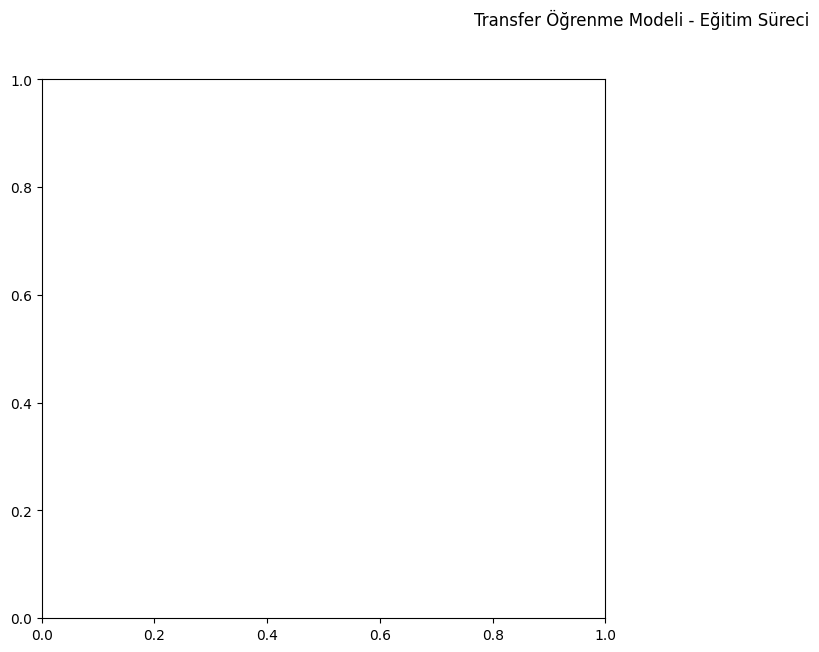


Test seti üzerinde performans değerlendiriliyor...
 2/12 ━━━━━━━━━━━━━━━━━━━━ 53s 5s/step - accuracy: 0.0000e+00 - loss: 0.9027

[ WARN:171@21948.497] global grfmt_png.cpp:695 read_chunk chunk data is too large


12/12 ━━━━━━━━━━━━━━━━━━━━ 94s 8s/step - accuracy: 0.2706 - loss: 0.7976
  -> Transfer Model Test Seti Doğruluğu: 58.59%
 1/12 ━━━━━━━━━━━━━━━━━━━━ 2:19 13s/step

[ WARN:172@22055.661] global grfmt_png.cpp:695 read_chunk chunk data is too large


12/12 ━━━━━━━━━━━━━━━━━━━━ 98s 8s/step

Transfer Model - Sınıflandırma Raporu:

              precision    recall  f1-score   support

        fire       0.00      0.00      0.00       159
      nofire       0.59      1.00      0.74       225

    accuracy                           0.59       384
   macro avg       0.29      0.50      0.37       384
weighted avg       0.34      0.59      0.43       384



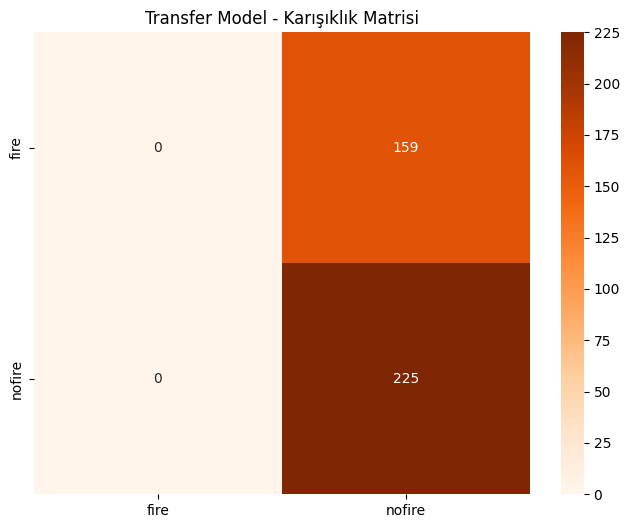

In [32]:
print("\n--- Transfer Öğrenme Modelinin Performans Analizi ---")

val_acc = transfer_history.history['val_accuracy']
loss = transfer_history.history['loss']
val_loss = transfer_history.history['val_loss']
epochs_range = range(len(acc))

plt.figure(figsize=(16, 7))
plt.subplot(1, 2, 1)
plt.suptitle("Transfer Öğrenme Modeli - Eğitim Süreci")
plt.show()


# Test Seti Değerlendirmesi 
print("\nTest seti üzerinde performans değerlendiriliyor...")
test_loss_tl, test_accuracy_tl = transfer_model.evaluate(test_generator, steps=len(test_generator))
print(f"  -> Transfer Model Test Seti Doğruluğu: {test_accuracy_tl * 100:.2f}%")


# Karışıklık Matrisi ve Sınıflandırma Raporu 
y_pred_probs_tl = transfer_model.predict(test_generator, steps=len(test_generator))
y_pred_tl = (y_pred_probs_tl > 0.5).astype("int32").reshape(-1)
y_true_tl = test_generator.labels[:len(y_pred_tl)]

print("\nTransfer Model - Sınıflandırma Raporu:\n")
print(classification_report(y_true_tl, y_pred_tl, target_names=class_labels))

cm_tl = confusion_matrix(y_true_tl, y_pred_tl)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_tl, annot=True, fmt='d', cmap='Oranges', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Transfer Model - Karışıklık Matrisi')
plt.show()

**Sonuçların Karşılaştırılması**

Son olarak, projenin en etkili çıktılarından biri olarak, sıfırdan eğittiğimiz Özel CNN Modelimiz ile Transfer Öğrenme Modelimizin performansını karşılaştıran bir özet sunacağız.

In [33]:
print("\n--- MODEL PERFORMANS KARŞILAŞTIRMASI ---")
print(f"Özel CNN Model (Sıfırdan) - Test Doğruluğu: {test_accuracy * 100:.2f}%")
print(f"Transfer Öğrenme (EfficientNetB0) - Test Doğruluğu: {test_accuracy_tl * 100:.2f}%")
print("\n-------------------------------------------")

# Yorum
if test_accuracy_tl > test_accuracy:
    print("\nSonuç: Transfer öğrenme modeli, daha yüksek bir test doğruluğu elde ederek daha üstün bir performans sergilemiştir.")
    print("Bu, önceden eğitilmiş bir modelin zengin özellik bilgisini yeni bir göreve aktarmanın gücünü göstermektedir.")
else:
    print("\nSonuç: Özel CNN modelimiz, transfer öğrenme modeline yakın veya daha iyi bir performans göstermiştir.")


--- MODEL PERFORMANS KARŞILAŞTIRMASI ---
Özel CNN Model (Sıfırdan) - Test Doğruluğu: 83.59%
Transfer Öğrenme (EfficientNetB0) - Test Doğruluğu: 58.59%

-------------------------------------------

Sonuç: Özel CNN modelimiz, transfer öğrenme modeline yakın veya daha iyi bir performans göstermiştir.
